In [1]:
import plotly

In [2]:
import sys
print(sys.version)

3.9.5 (default, May 18 2021, 14:42:02) [MSC v.1916 64 bit (AMD64)]


In [16]:
import pandas as pd
path='data/'  # si les données sont déjà dans le répertoire courant
loading = pd.read_csv(path+'velibLoading.csv', sep = " ")
loading.head()

,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
1,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143,0.000000,...,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923,0.115385,0.076923,0.153846,0.153846
2,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870,0.043478,...,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913,0.173913,0.173913,0.260870,0.391304
3,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545,0.109091,...,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296,0.314815,0.370370,0.370370,0.407407
4,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143,0.761905,0.761905,0.761905,0.761905
5,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623,0.971014,...,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182,0.636364,0.712121,0.621212,0.575758


In [17]:
Coord = pd.read_csv(path+'velibCoord.csv', sep = " ")
Coord.head()

,longitude,latitude,bonus,names
1,2.377389,48.886300,0,EURYALE DEHAYNIN
2,2.317591,48.890020,0,LEMERCIER
3,2.330447,48.850297,0,MEZIERES RENNES
4,2.271396,48.833734,0,FARMAN
5,2.366897,48.845887,0,QUAI DE LA RAPEE


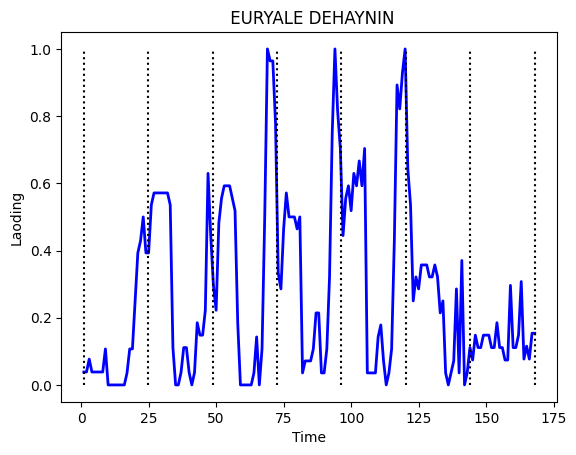

In [18]:
# Plot the loading of the first station
import matplotlib as plt
from pylab import * 
import numpy as np

p = loading.columns.size
Time = np.linspace(1, p, p)
plot(Time, loading.transpose()[1], linewidth = 2, color = 'blue')
xlabel('Time'); ylabel('Laoding'); title(Coord.names[1])
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
show()

In [19]:
count_nonzero(Coord["bonus"])/(len(Coord["bonus"]))

0.10681244743481917

## Analyse Descriptive

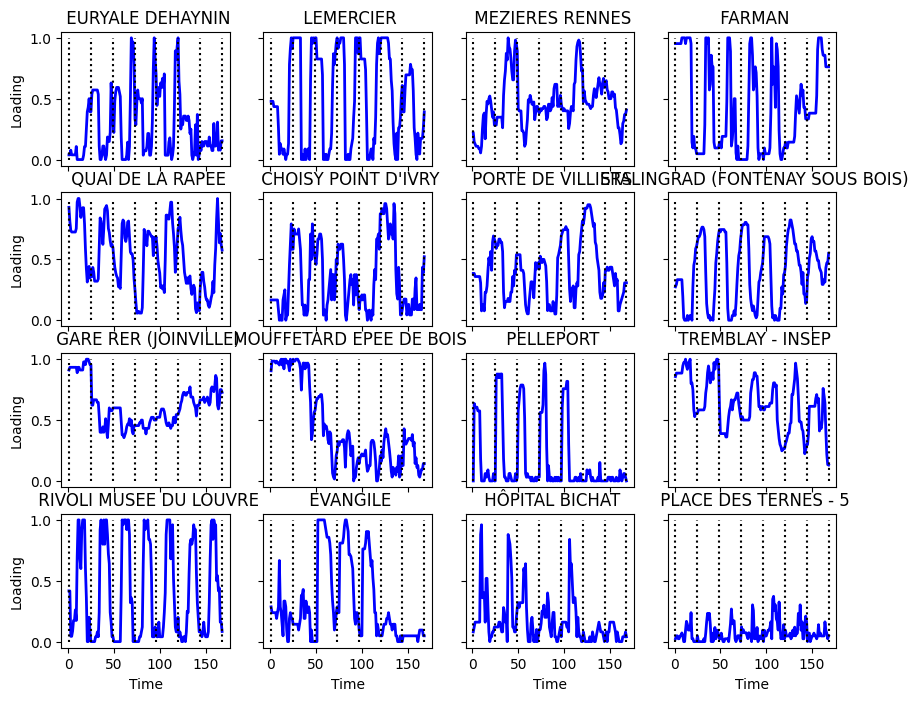

In [20]:
fig, axs = subplots(4, 4, figsize=(10,8))
p = loading.columns.size
Time = np.linspace(1, p, p)

for i in range(4):
    for j in range(4):
        axs[i,j].plot(Time, loading.transpose()[4*i+j+1], linewidth = 2, color = 'blue')
        axs[i,j].set_title(Coord.names[4*i+j+1])
        axs[i,j].vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
        
        
for ax in axs.flat:
    ax.set(xlabel='Time', ylabel='Loading')  
for ax in axs.flat:
    ax.label_outer()

        
show()

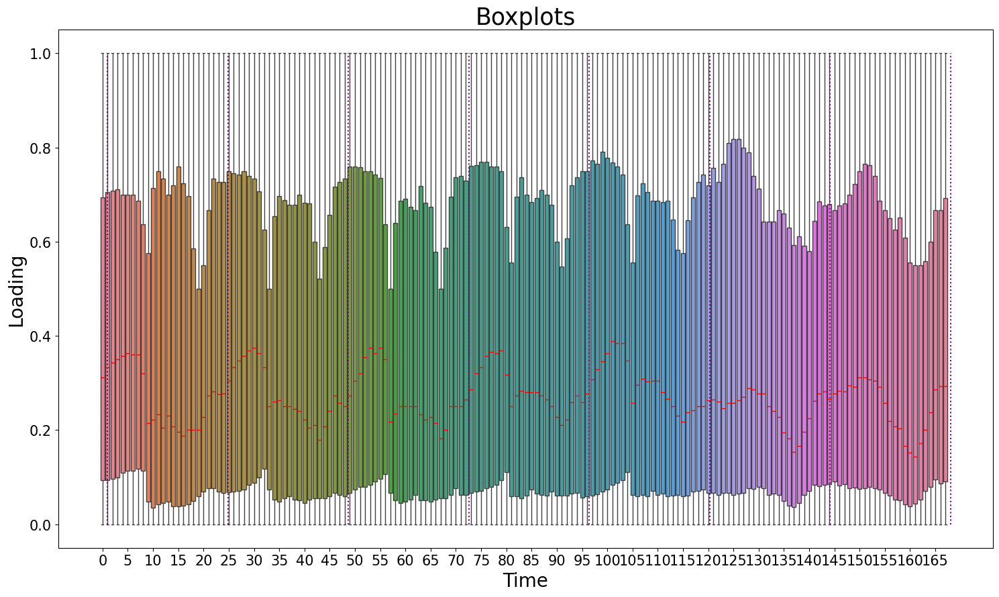

In [21]:
import seaborn as sns
%matplotlib inline

figure(figsize = (15,9))

ar=np.array(loading)
bp = sns.boxplot(data=ar, medianprops={"color": "red"},)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "purple", linestyle = "dotted",)

plt.xlabel('Time',fontsize = 20)
plt.ylabel('Loading', fontsize = 20)
plt.title("Boxplots", fontsize = 25)
plt.xticks(ticks = np.arange(0,168,5), labels=np.arange(0,168,5), fontsize= 15)
plt.yticks(fontsize = 15)
plt.tight_layout()
plt.show()

## Chargement par heure moyen par jour

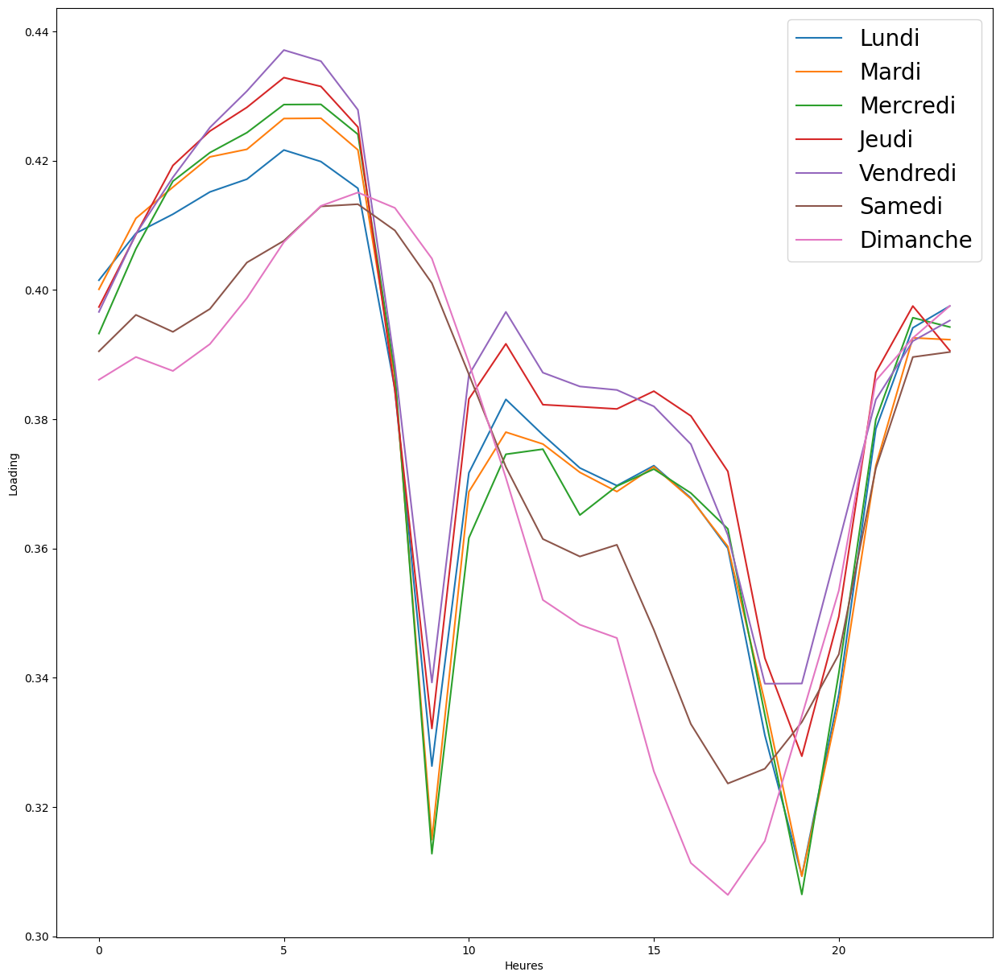

In [22]:
figure(figsize = (15,15))

MoyHeures=np.sum(loading,axis=0)/1189
MoyHeures=np.array(MoyHeures)
#print(MoyHeures)
jours = ["Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche"]
MoyHeuresPJours=np.reshape(MoyHeures,(24,7), order='F')
plot(MoyHeuresPJours)
xlabel("Heures")
ylabel("Loading")
legend(jours, prop={'size' : 20})
show()

In [23]:
import plotly.express as px


Position=np.array(Coord)[:,0:2]


a6 = np.arange(6,168,24, dtype=int)
data6h=np.mean(np.array(loading)[:,a6],axis=1)




fig6 = px.scatter_mapbox(data6h ,Position[:,1],Position[:,0], color = data6h,color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, mapbox_style="carto-positron")
fig6.show()

a12 = np.arange(12,168,24, dtype=int)
data12h=np.mean(np.array(loading)[:,a12],axis=1)




fig12 = px.scatter_mapbox(data12h ,Position[:,1],Position[:,0], color = data12h,color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, mapbox_style="carto-positron")
fig12.show()

a23 = np.arange(23,168,24, dtype=int)
data23h=np.mean(np.array(loading)[:,a23],axis=1)



fig23 = px.scatter_mapbox(data23h ,Position[:,1],Position[:,0], color = data23h,color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, mapbox_style="carto-positron")
fig23.show()

In [24]:
bonus=np.array(Coord)[:,2]
#help(px.scatter_mapbox)
data24h=np.mean(np.array(loading),axis=1)
figbonus = px.scatter_mapbox(Coord ,'latitude','longitude', color_discrete_sequence=[ 'blue', 'red'], color='bonus',size_max=15, zoom=10, mapbox_style="carto-positron",)
figbonus.show()


In [25]:
loading.head()
loading.describe()
x=np.array(loading)

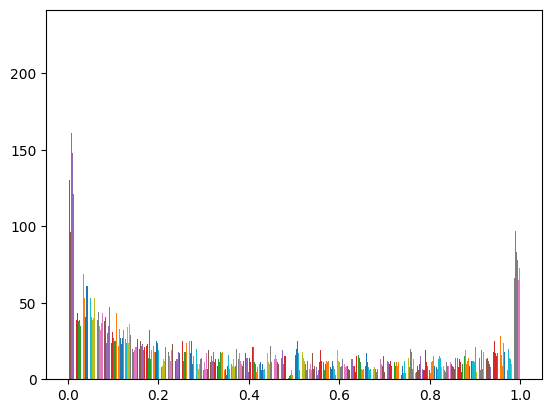

In [26]:
plt.hist(x, bins=64)
plt.show()

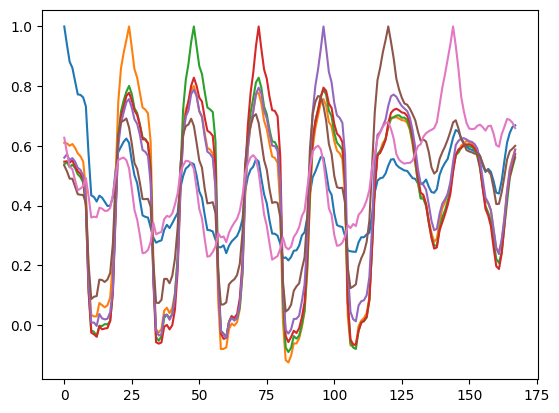

In [27]:
correlation=np.corrcoef(x.T)
for i in range(int(len(correlation)/24)):
    plt.plot(correlation[i*24])

C:\Users\romai\miniconda3\lib\site-packages\pyensae\graphhelper\linkage.py:43: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



<Axes: >

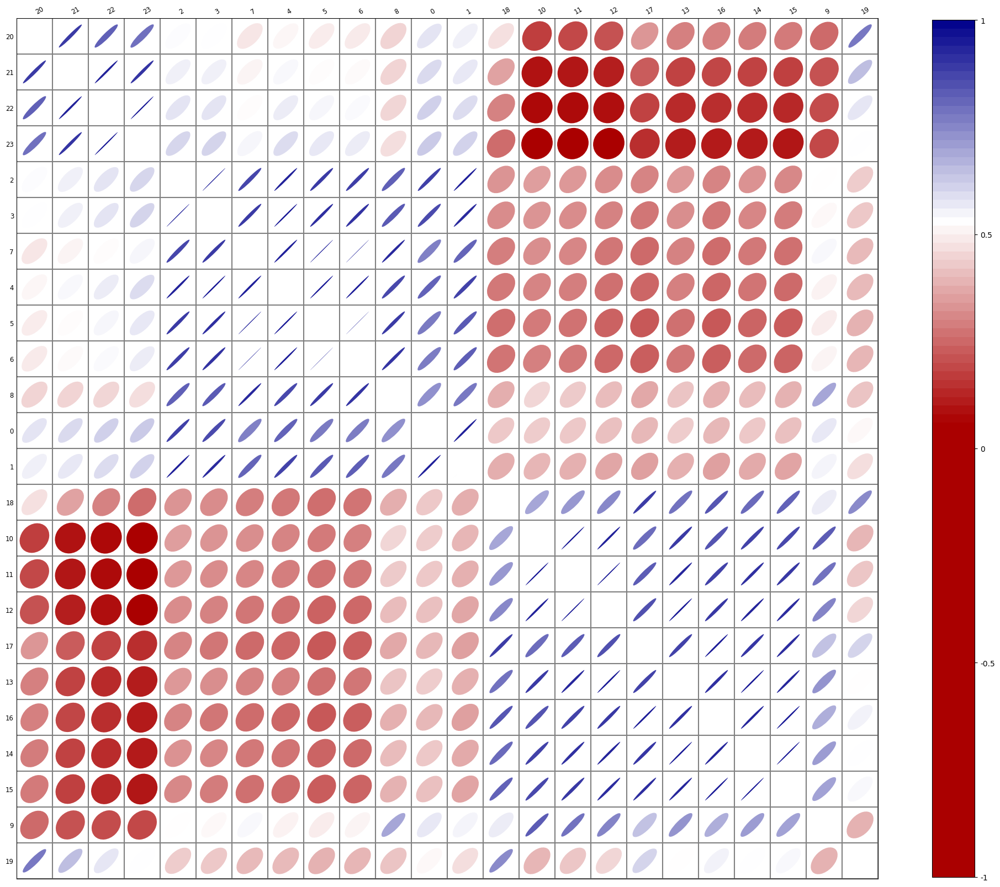

In [28]:
from pyensae.graphhelper import Corrplot

c = Corrplot(x[:,0:24])
c.plot(figsize=(20,20))



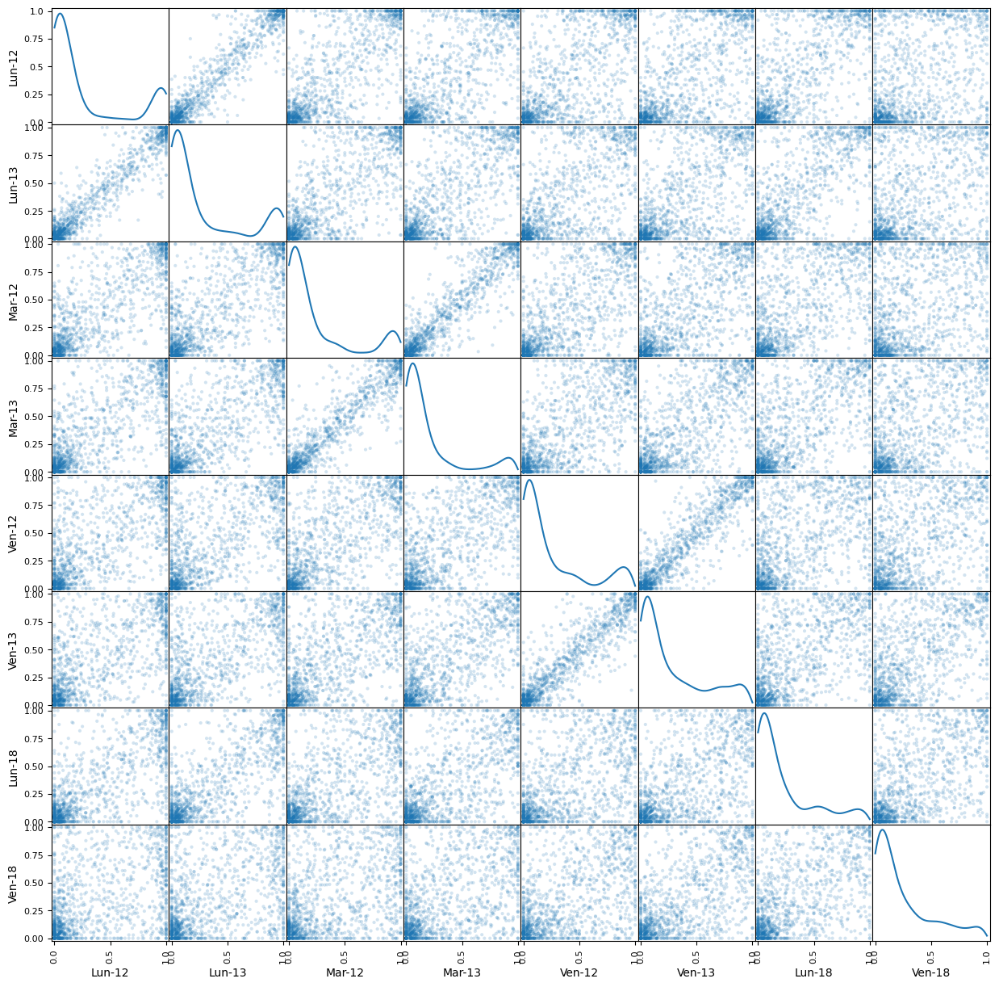

In [29]:
from pandas.plotting import scatter_matrix
scatter_matrix(loading[["Lun-12","Lun-13","Mar-12","Mar-13","Ven-12","Ven-13","Lun-18","Ven-18"]], alpha=0.2, 
               figsize=(15, 15), diagonal='kde')
plt.show()

# PCA

## Implémentation de la PCA

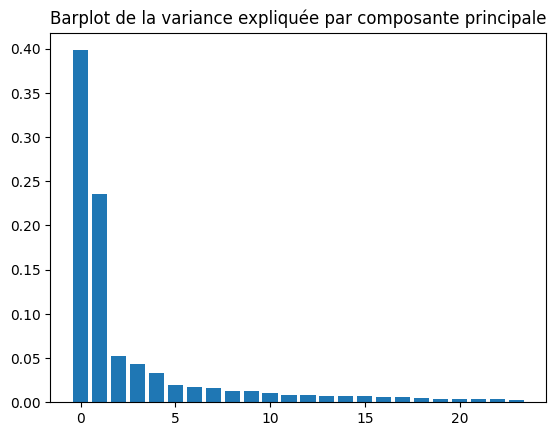

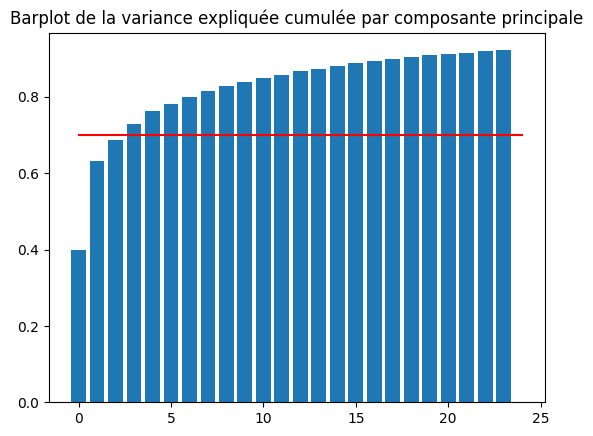

In [30]:
from sklearn.decomposition import PCA 
from sklearn.preprocessing import scale

pca = PCA()
#On estime nos composantes principales
pcaR = pd.DataFrame(scale(loading), columns = loading.columns)
C = pca.fit(pcaR).transform(pcaR)
## Décroissance de la variance expliquée
plt.bar(np.arange(len(pca.explained_variance_ratio_))[0:24],height=pca.explained_variance_ratio_[0:24])
plt.title("Barplot de la variance expliquée par composante principale")
plt.show()
plt.bar(np.arange(len(pca.explained_variance_ratio_))[0:24],height=np.cumsum(pca.explained_variance_ratio_[0:24]))
plt.plot(range(0,25), np.ones(25)*0.7, c='r')
plt.title("Barplot de la variance expliquée cumulée par composante principale")
plt.show()

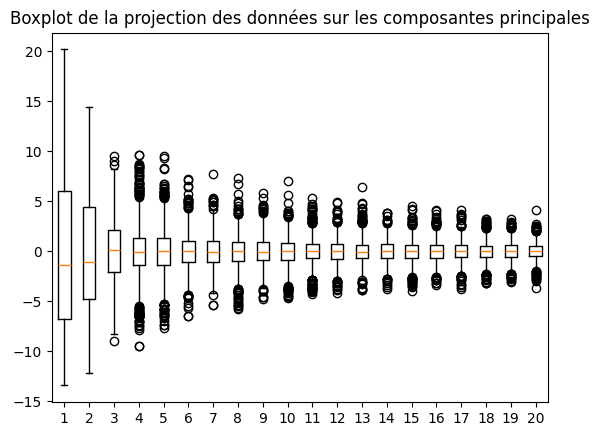

In [31]:
plt.boxplot(C[:,0:20])
plt.title("Boxplot de la projection des données sur les composantes principales")
plt.show()

## Projection des variables sur le plan d'ACP

C:\Users\romai\AppData\Local\Temp/ipykernel_49500/3335837705.py:6: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



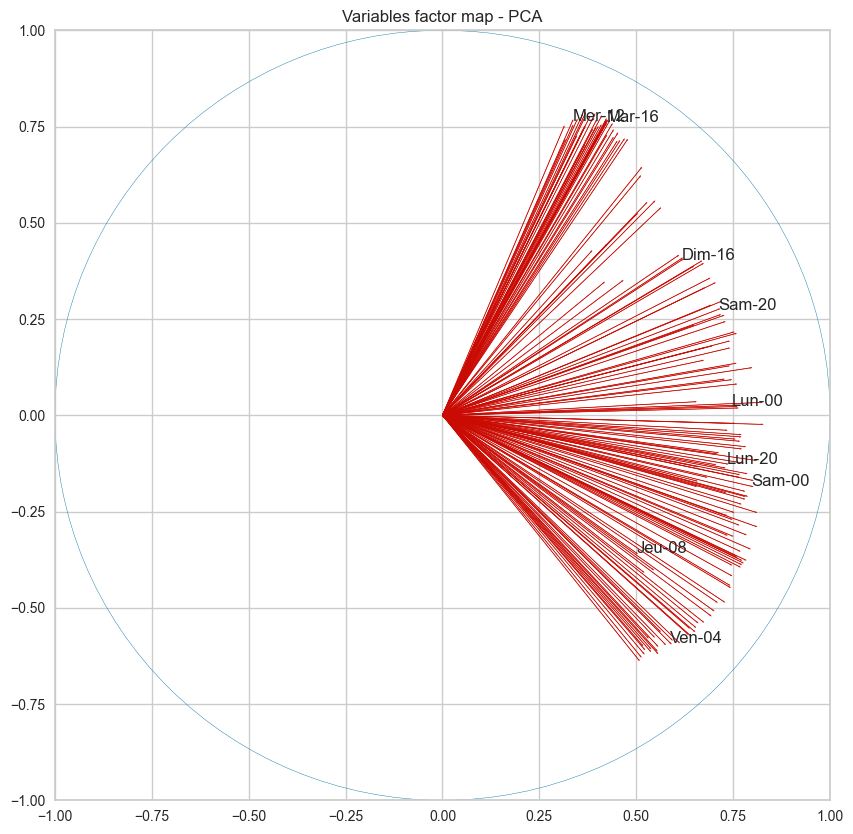

In [314]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, loading.columns):
    if int(np.argwhere(coord1==i))%20==0 : 
        plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()
#différencier jour/nuit

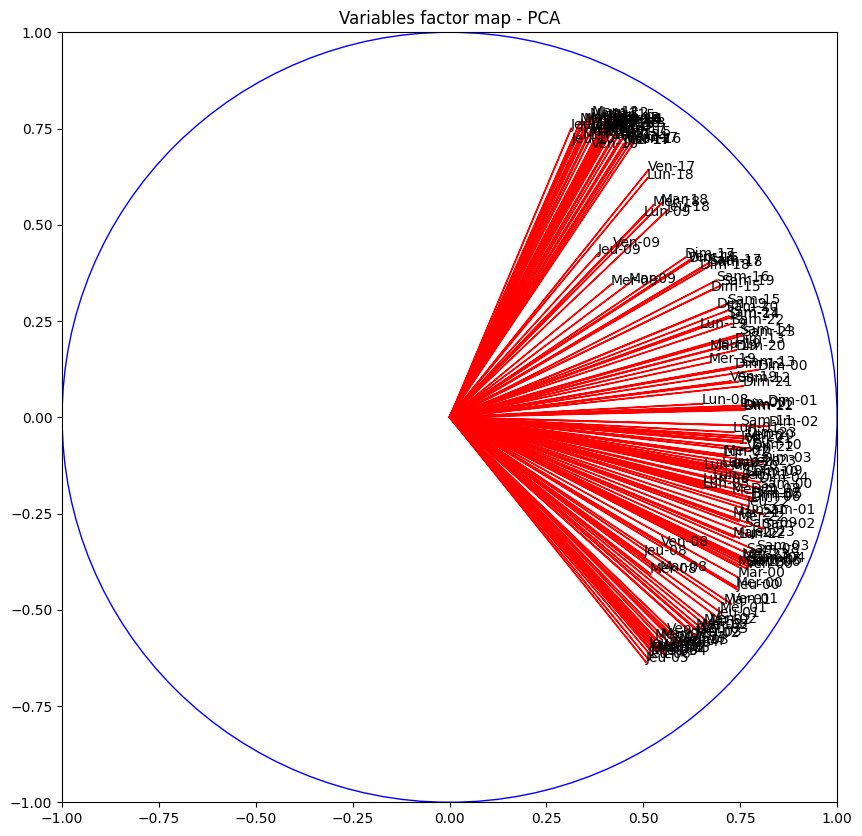

In [33]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[1] * np.sqrt(pca.explained_variance_[1])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, loading.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()
#différencier jour/nuit

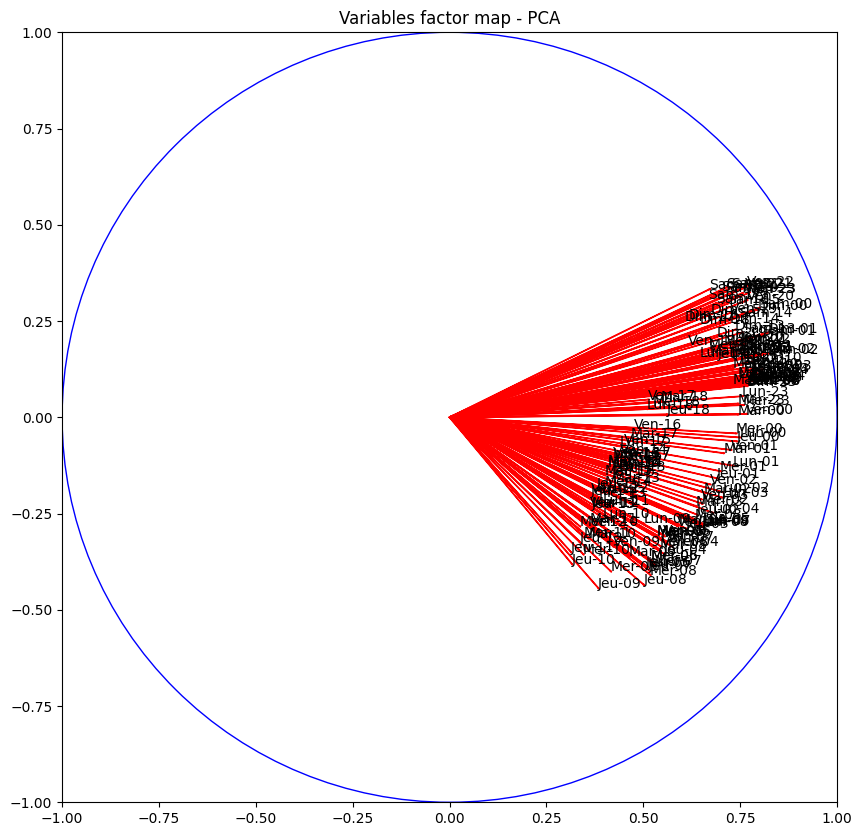

In [34]:
coord1 = pca.components_[0] * np.sqrt(pca.explained_variance_[0])
coord2 = pca.components_[2] * np.sqrt(pca.explained_variance_[2])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, loading.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()
#différencier jour/nuit

## Interprétation des dimensions de l'ACP

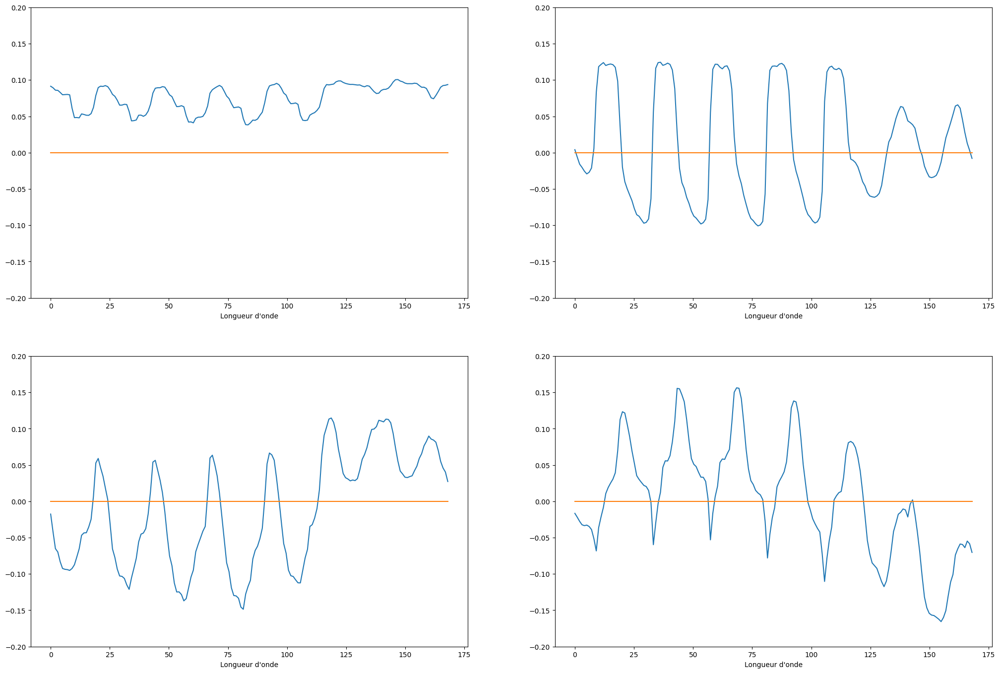

In [35]:
fig = plt.figure(1, figsize = (25, 35))
u= np.linspace(0,168,168)
for i in range(4):
   fig.add_subplot(4, 2, i+1)
   plt.ylim((-0.2, 0.2))
   plt.plot(u, pca.components_[i])
   plt.plot(u, [0] * len(u))
   plt.xlabel("Longueur d'onde")
plt.show()

Les 4 plots représentent les coefficients pour les 168 heures, et pour les 4 premières dimensions de l'ACP.

Le premier plot (sur la dimension 1) représente la moyenne des chargements sur toutes les stations au cours des heures.

Le deuxième plot (sur la dimension 2) le contraste entre le jour et la nuit: en pleine journée les coeffs sont positifs alors que la nuit ils sont négatifs.

Le troisième plot (sur la dimension 3) le contraste entre les jours en pleine semaine et weekend.

## Projection des individus sur le plan ACP

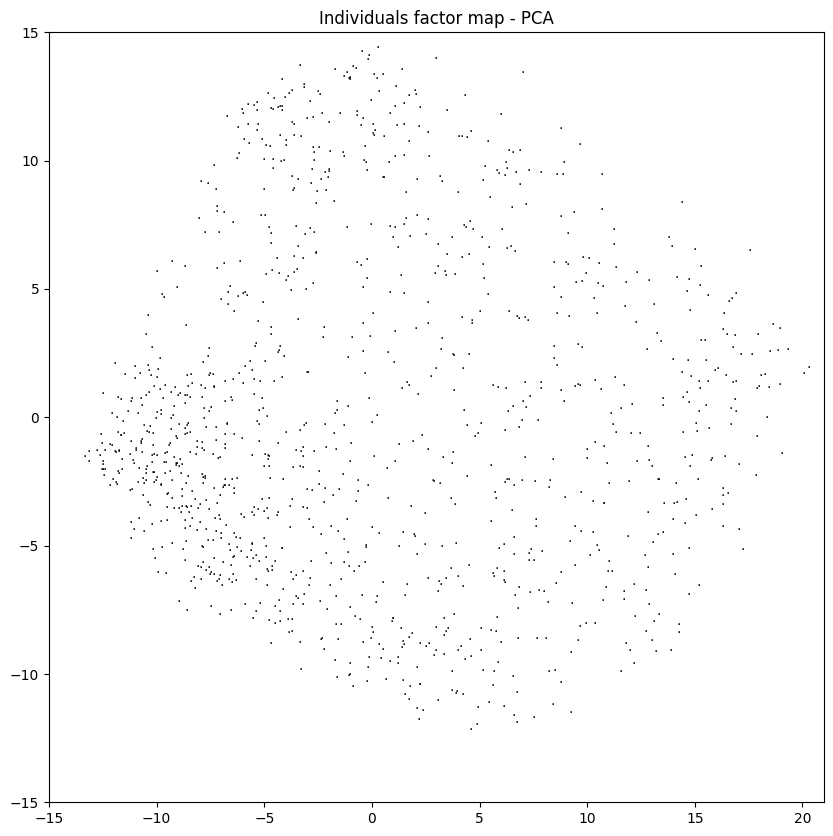

In [36]:
pc1 = C[:,0]
pc2 = C[:,1]
plt.figure(figsize = (10, 10))
for i, j in zip(pc1, pc2):
    plt.text(i, j, ".")
plt.axis((-15, 21, -15, 15))
plt.title('Individuals factor map - PCA')
plt.show()

In [37]:
#print(C)
velib_PCA_reduced= C[:,:3] #pourquoi c'est 3 ???
#print(velib_PCA_reduced)

# Clustering

## Kmeans

In [38]:
#pip install yellowbrick

In [39]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import colors
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.spatial.distance import cdist
from matplotlib.patches import Ellipse

In [40]:
def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters

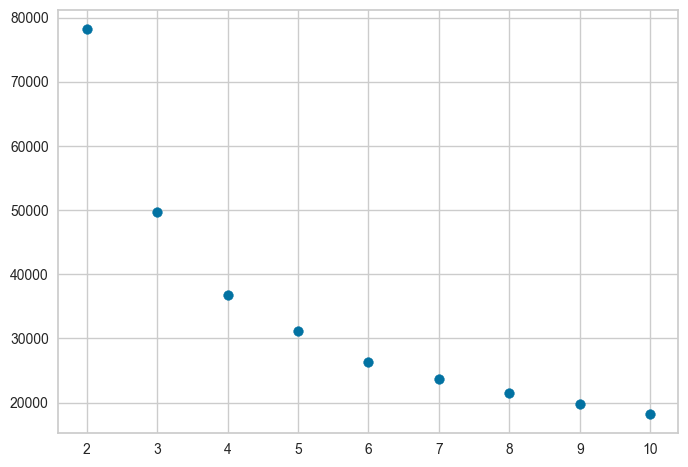

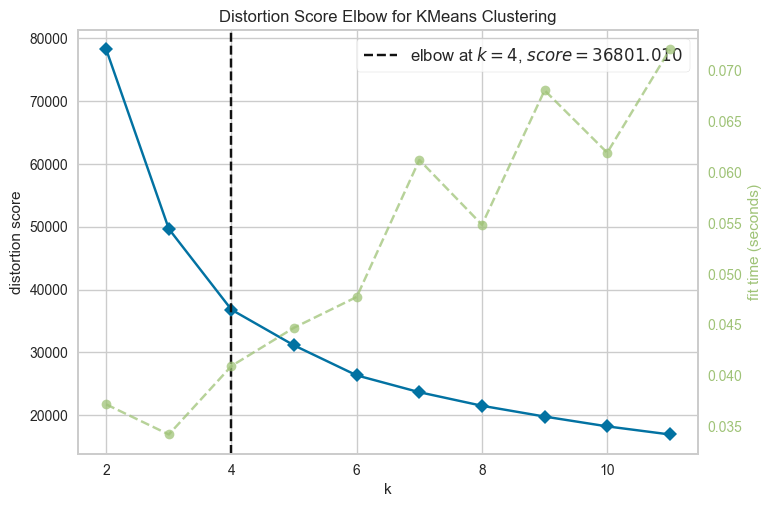

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [41]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    kmeans.fit(velib_PCA_reduced)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)

plt.scatter(range(2, 11), inertia[1:])
plt.show()


kmeans = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(2,12))

visualizer.fit(velib_PCA_reduced)   
visualizer.show()    

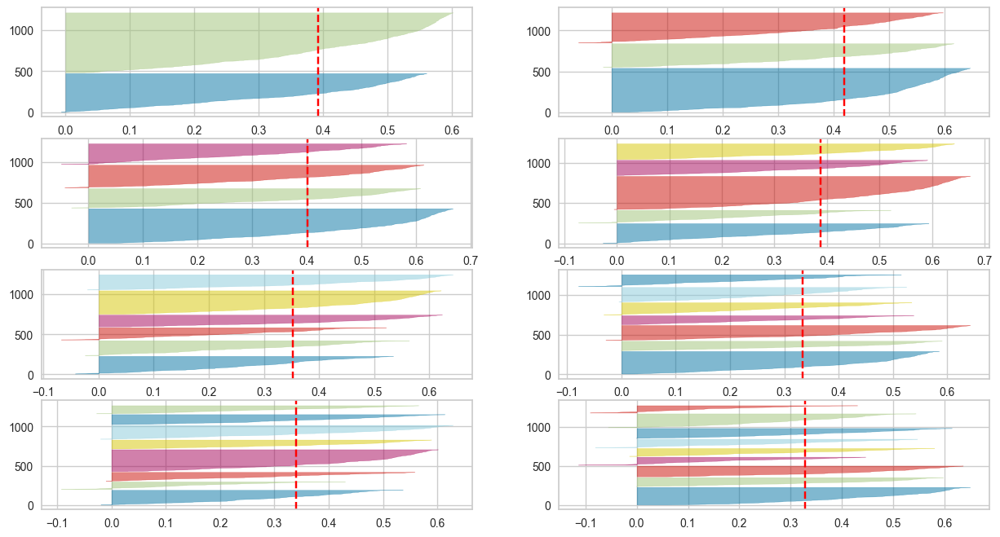

In [42]:
fig, ax = plt.subplots(4, 2, figsize=(15,8))

for k in range(2, 10):
   
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(k, 2)
    
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(velib_PCA_reduced)

In [43]:
K = 4
kmeans_pca = KMeans(n_clusters=K, random_state=0)
clusters_pca = kmeans_pca.fit_predict(velib_PCA_reduced)
cmap = plt.get_cmap('Set3',K)

De ce que l'on peut observer grâce à la méthode du coude. Et en choisissant le graphe silouhette ayant le moins de valeurs négatives et dont les pics dépassent tous la ligne rouge. On voit que 4 clusters est le meilleur choix. On utilisera donc K = 4 pour la suite.

C:\Users\romai\AppData\Local\Temp/ipykernel_49500/2251800299.py:3: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



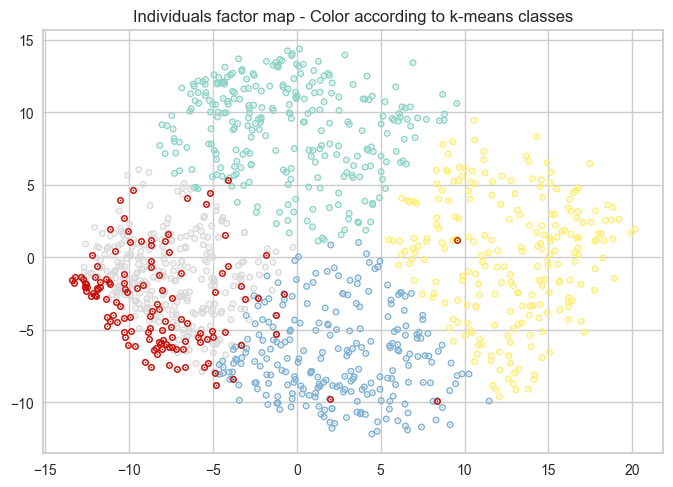

In [44]:
# on plot par rapport au clustering fait sur le jeu de données réduit
plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_pca, s=1, linewidths=4, cmap=cmap)
plt.scatter(velib_PCA_reduced[np.where(bonus==1),0], velib_PCA_reduced[np.where(bonus==1),1], c='r',s=1, linewidths=4,cmap=cmap, )
plt.title("Individuals factor map - Color according to k-means classes")
plt.grid(True)
plt.show()
# A rajouter : mettre les stations en altitude (bonus =1)???

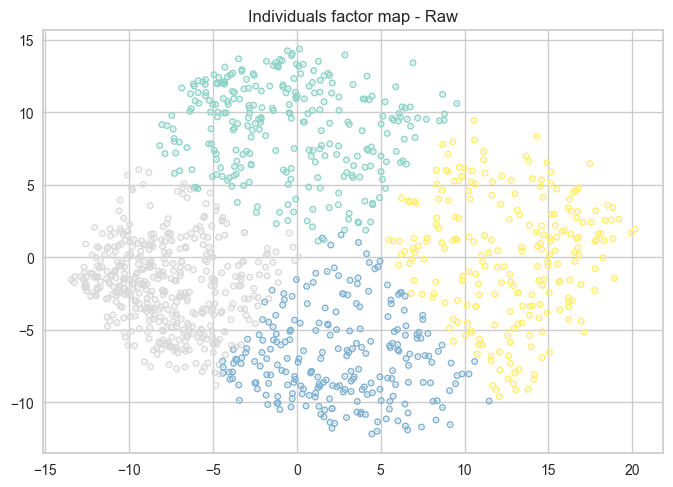

In [45]:
#On fait un clustering Kmeans sur le jeu de données loading complet
K = 4
kmeans_raw = KMeans(n_clusters=K, random_state=0)
clusters_raw = kmeans_pca.fit_predict(loading)

plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_raw, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - Raw")
plt.show()

Matrice de confusions pour comparer nos clusters:


Classes size: [276 234 423 233]
Class (in the classif1 numbering): [0 1 2 3]



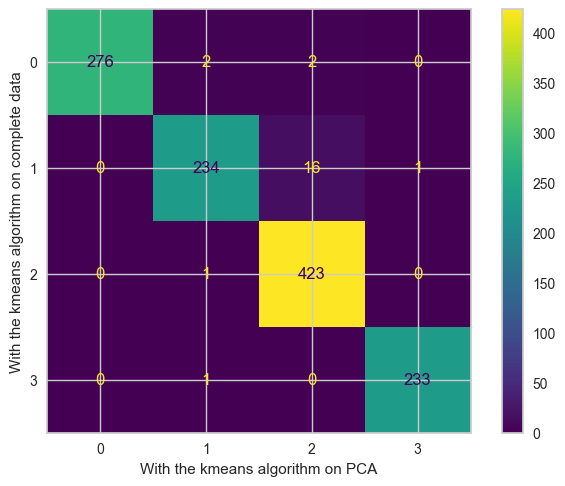

In [46]:
cm, clusters_kmean_raw_sorted = matchClasses(clusters_pca, clusters_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm on PCA')
plt.ylabel('With the kmeans algorithm on complete data')

plt.show()

Faire du Kmeans sur le jeu de données PCA (réduit) ou le jeu de données Brut est similaire. Mais avec PCA on a réduit la dimensions, donc plus intéressant.

Visualiser par cartographie le Kmeans :

In [47]:
Position=np.array(Coord)[:,0:2]

df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_pca.astype(int)
    

})


fig_cluster_pca = px.scatter_mapbox(clusters_pca ,Position[:,1],Position[:,0], color = clusters_pca,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",
                                   title ="Individual factor map with clusters kmeans on PCA data")
fig_cluster_pca.show()

In [48]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_kmean_raw_sorted.astype(int)

})


fig_cluster_raw = px.scatter_mapbox(clusters_kmean_raw_sorted ,Position[:,1],Position[:,0], color = clusters_kmean_raw_sorted,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",title ="Individual factor map with clusters kmeans on complete data")
fig_cluster_raw.show()

On remarque qu'il n'y a presque aucun changement entre les deux cartographies, que ce soit pour les clusters faits sur les données PCA, ou les clusters faits sur les données brutes. Ceci nous donne le même résultat qu'obtenu par la table de contingence.

In [49]:
bonus=np.array(Coord)[:,2]
fig_alt = px.scatter_mapbox(bonus, lat=Position[:,1], lon=Position[:,0], color=bonus,
                    color_discrete_sequence=['goldenrod', 'fuchsia'],
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title='individual facor map for a "cluster" based on the "bonus" variable')
fig_alt.update_layout(showlegend=True)
fig_alt.show()

## Que valent ces 4 clusters Kmeans?

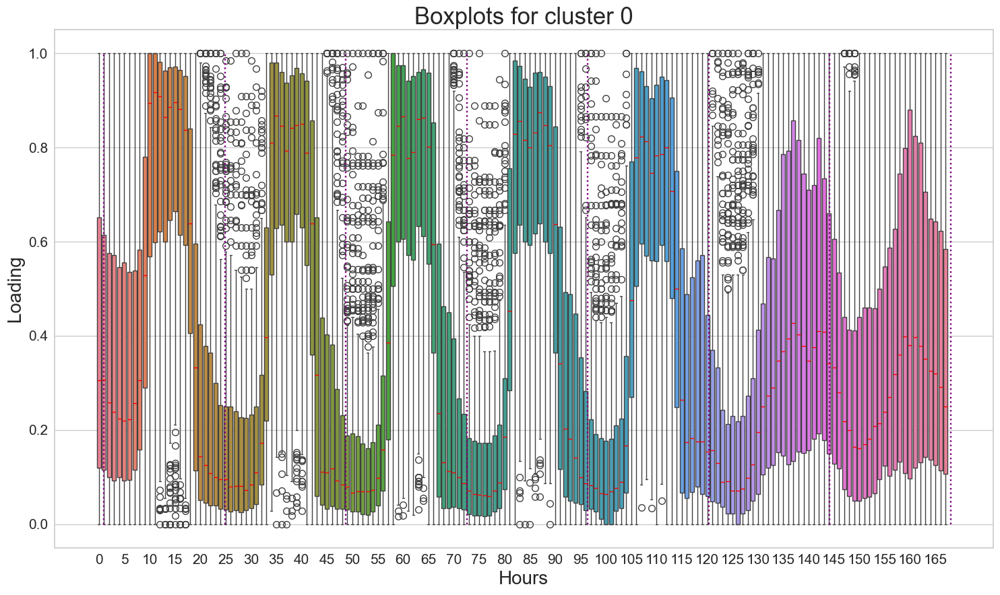

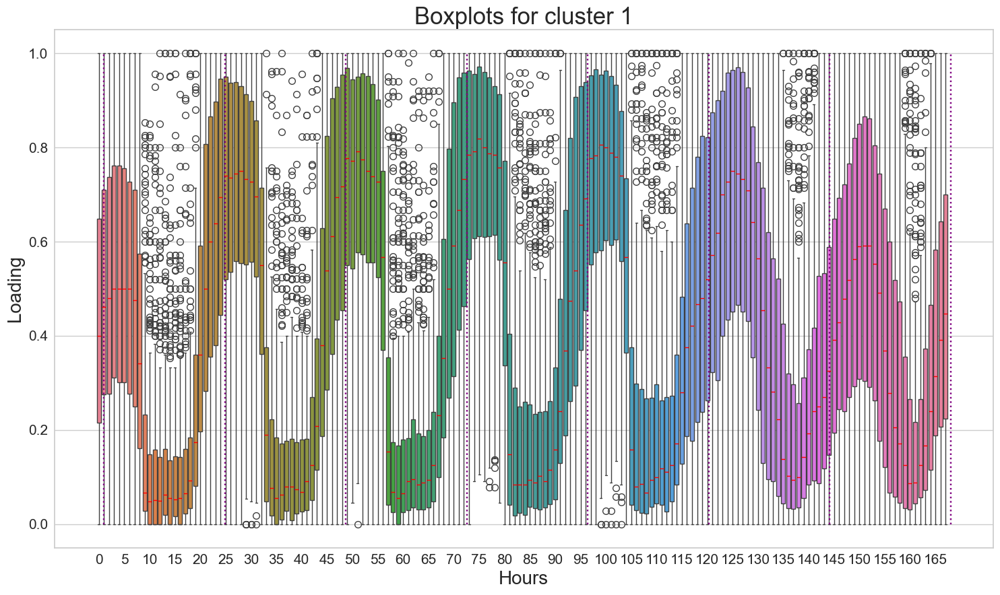

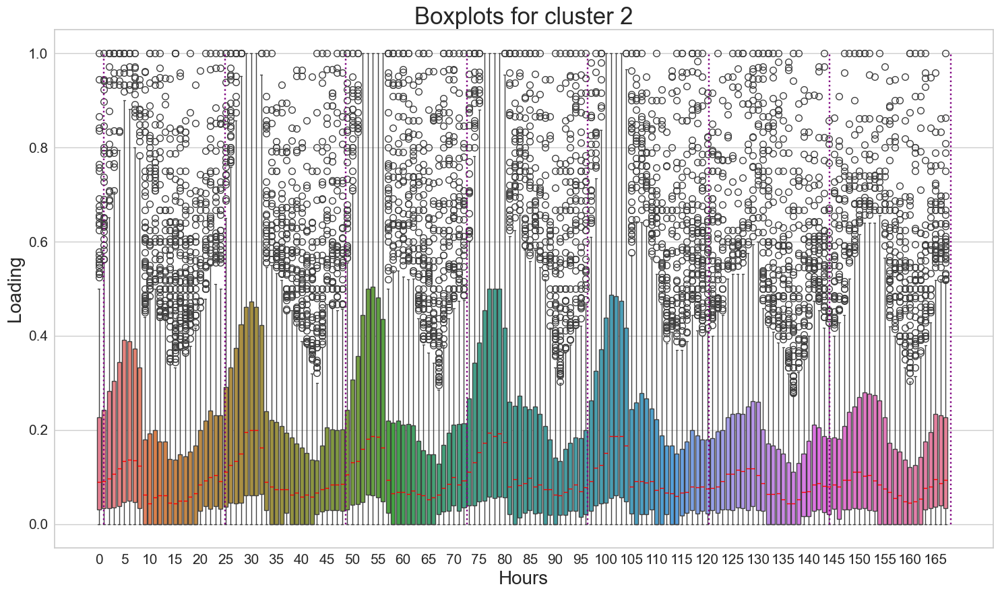

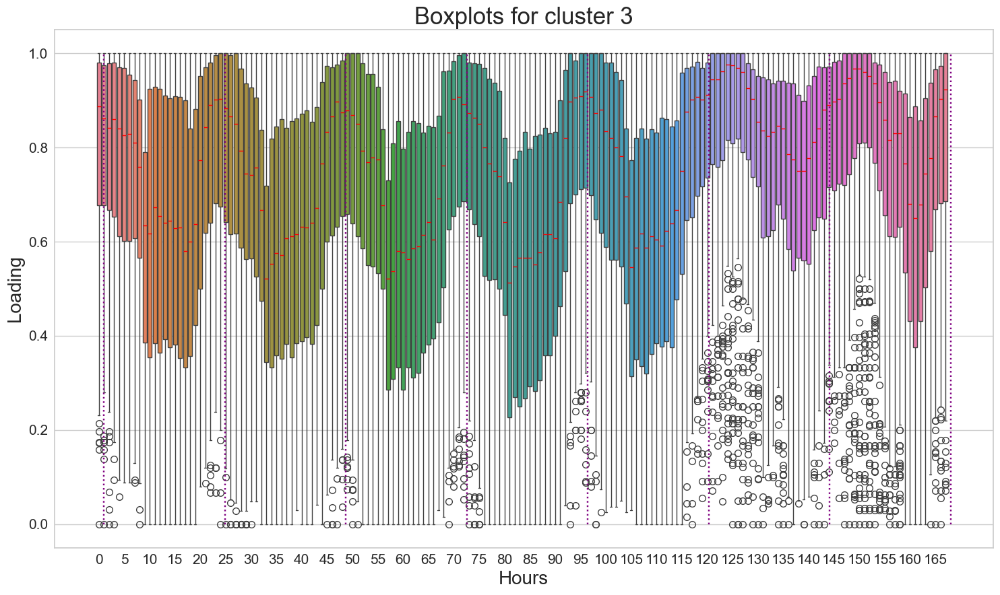

In [50]:
for i in range(4):
    indice = (clusters_pca==i).nonzero()
    indice = np.array(indice)

        
    figure(figsize = (15,9))
    sns.boxplot(data=ar[indice,:][0], medianprops={"color": "red"},)
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "purple", linestyle = "dotted",)
    

    plt.xlabel('Hours',fontsize = 20)
    plt.ylabel('Loading', fontsize = 20)
    plt.title("Boxplots for cluster " + str(i), fontsize = 25)
    plt.xticks(ticks = np.arange(0,168,5), labels=np.arange(0,168,5), fontsize= 15)
    plt.yticks(fontsize = 15)
    plt.tight_layout()
    plt.show()
    plt.show()


cluster 0 : Moyenne des chargements des stations sur les 7 jours de la semaine. Comportement périodique sur les 7 jours. On peut différentier le jour et la nuit.

Cluster 1 : Pareil que le cluster 0 mais signe opposé. 

Cluster 2: En semaine plus d'amplitude que pendant le weekend. Peu de variation entre le matin et le soir

Cluster 3 : La moyenne des chargements est haute.


# Agglomerative Clustering

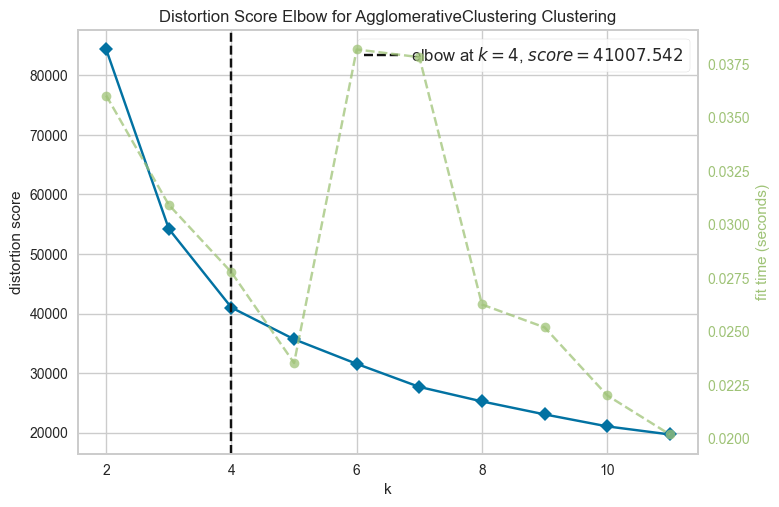

In [51]:
ac = AgglomerativeClustering(linkage='ward', compute_distances=True)
visualizer = KElbowVisualizer(ac, k=(2,12))

visualizer.fit(velib_PCA_reduced)  # Fit the data to the visualizer
visualizer.show()   
plt.show()

La méthode du coude nous suggere de prendre 4 clusters.

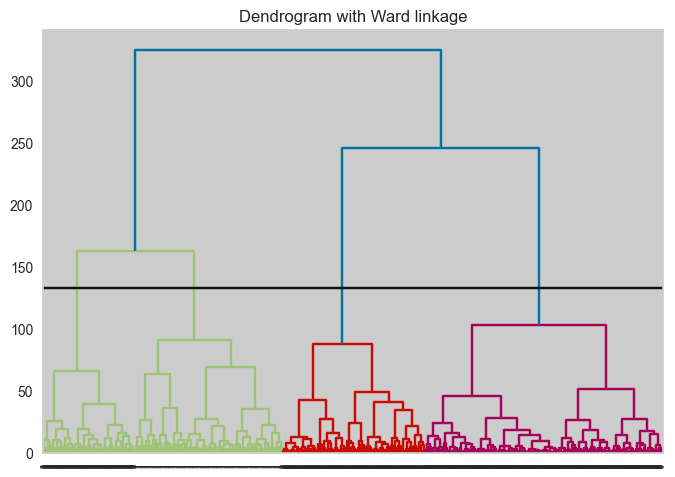

In [52]:
K = 4

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters = ac.fit(velib_PCA_reduced)

children = ac.children_
distances = ac.distances_
n_observations = np.arange(2, children.shape[0]+2)
linkage_matrix = np.c_[children, distances, n_observations]

sch.dendrogram(linkage_matrix, labels=ac.labels_)

# Cutting the dendrogram to get K classes
max_d = .5*(ac.distances_[-K]+ac.distances_[-K+1])
plt.axhline(y=max_d, c='k')

plt.title("Dendrogram with Ward linkage")
plt.show()


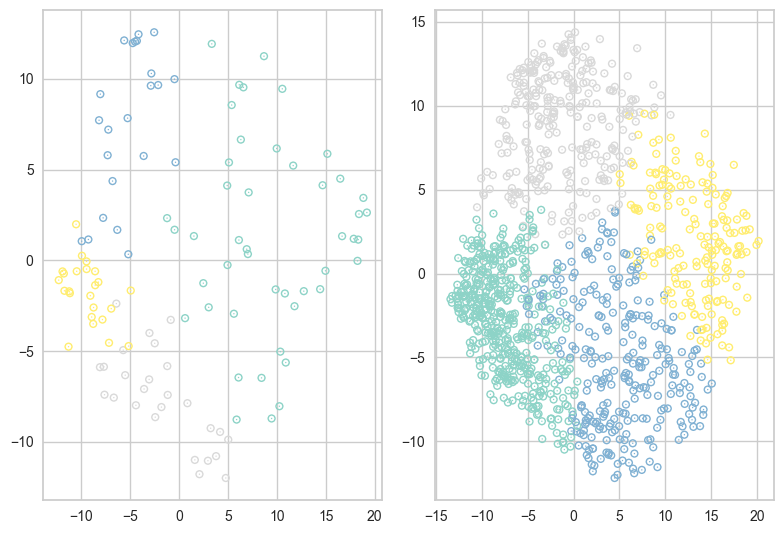

In [53]:
K = 4

cmap = plt.get_cmap('Set3', K)

# -- #

ac_ss = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters_ac_ss = ac_ss.fit_predict(velib_PCA_reduced[::10])

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters_ac = ac.fit_predict(velib_PCA_reduced)

# -- #

# On the sub-sample
plt.subplot(1,2,1)
plt.scatter(velib_PCA_reduced[::10][:,0], velib_PCA_reduced[::10][:,1], c=clusters_ac_ss, s=1, linewidths=5, cmap=cmap)

# On the complete dataset
plt.subplot(1,2,2)
plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_ac, s=1, linewidths=5, cmap=cmap)

plt.tight_layout()
plt.show()


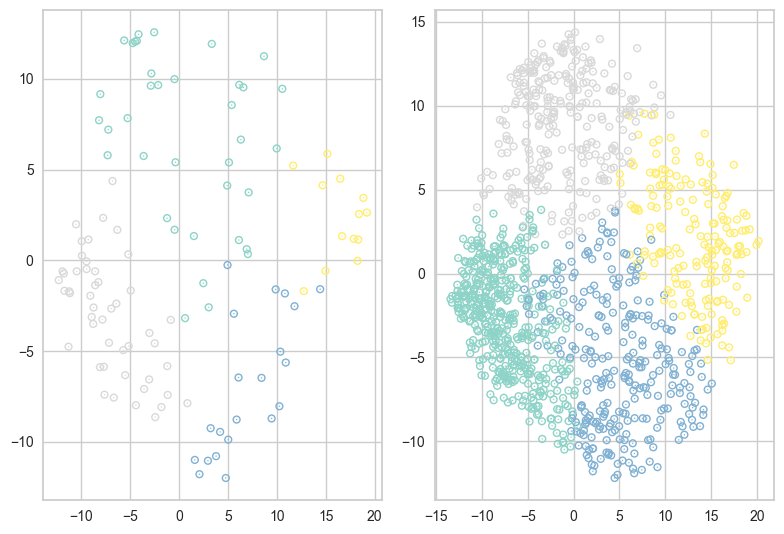

In [54]:
K = 4

cmap = plt.get_cmap('Set3', K)

# -- #

ac_ss = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters_ac_ss = ac_ss.fit_predict(loading[::10])

ac = AgglomerativeClustering(n_clusters=K, compute_distances=True, linkage='ward')
clusters_ac_raw = ac.fit_predict(loading)

# -- #

# On the sub-sample
plt.subplot(1,2,1)
plt.scatter(velib_PCA_reduced[::10][:,0], velib_PCA_reduced[::10][:,1], c=clusters_ac_ss, s=1, linewidths=5, cmap=cmap)

# On the complete dataset
plt.subplot(1,2,2)
plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_ac, s=1, linewidths=5, cmap=cmap)

plt.tight_layout()
plt.show()

Matrice de Confusion pour les clusters CAH sur le jeu de données réduit et brutes.


Classes size: [257 124 393 119]
Class (in the classif1 numbering): [2 3 0 1]



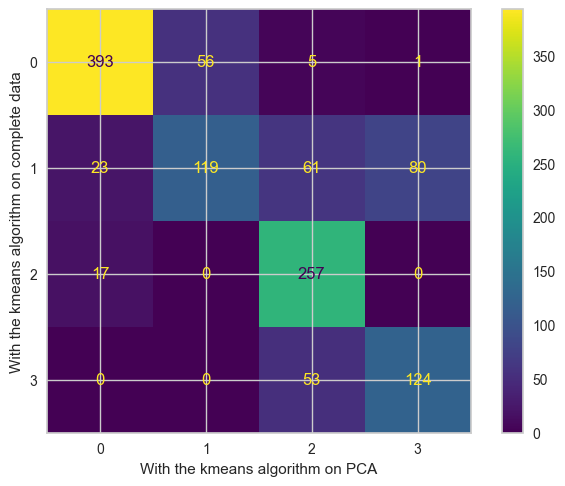

In [55]:
cm, clusters_ac_raw_sorted = matchClasses(clusters_ac, clusters_ac_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm on PCA')
plt.ylabel('With the kmeans algorithm on complete data')

plt.show()

In [56]:

df_clusters_pca =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_ac.astype(int)
    

})


fig_cluster_pca2 = px.scatter_mapbox(clusters_ac ,Position[:,1],Position[:,0], color = clusters_ac,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",
                                   title ="Individual factor map with clusters CAH on PCA data")

fig_cluster_pca2.update_layout(showlegend=True)
fig_cluster_pca2.show()

In [57]:

df_clusters_pca =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_ac_raw_sorted.astype(int)
    

})


fig_cluster_ac_raw = px.scatter_mapbox(clusters_ac_raw_sorted ,Position[:,1],Position[:,0], color = clusters_ac_raw_sorted,
                        color_discrete_sequence=['red', 'blue', 'green', 'fuchsia'], 
                        size_max=15, zoom=10, mapbox_style="carto-positron",
                                   title ="Individual factor map with clusters CAH on complete data")

fig_cluster_ac_raw.update_layout(showlegend=True)
fig_cluster_ac_raw.show()

Pareil ici peu de différences dans l'ensemble, sauf en périphérie !

# Gaussian Mixture Models

In [58]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

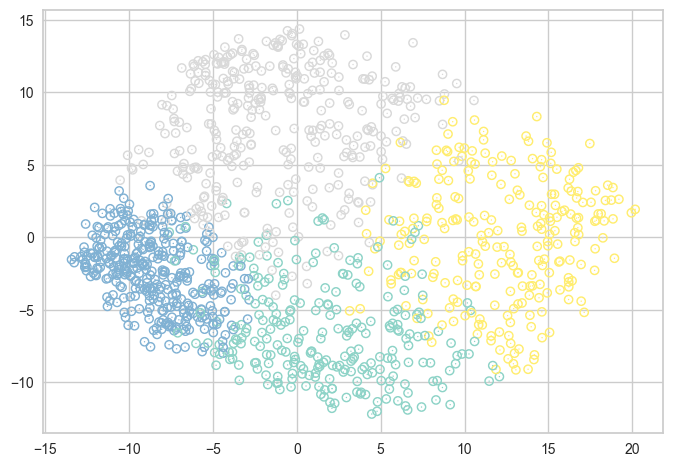

In [59]:
gmm = GaussianMixture(n_components=K, n_init=50)
clusters_gmm = gmm.fit_predict(velib_PCA_reduced)


plt.scatter(velib_PCA_reduced[:,0], velib_PCA_reduced[:,1], c=clusters_gmm, s=1, linewidths=6, cmap=cmap)

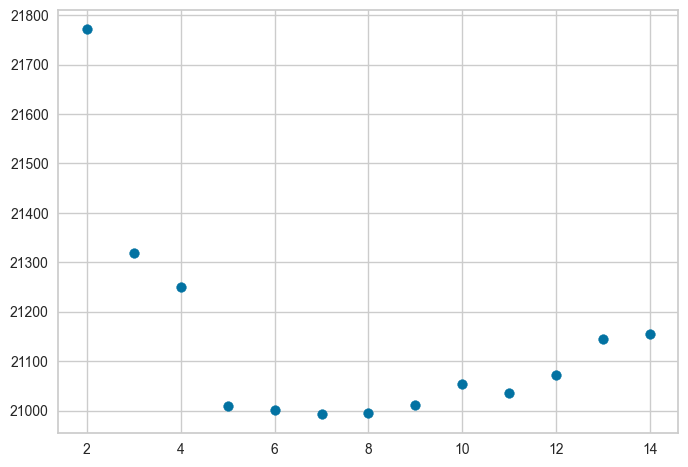

In [60]:
k_max = 15

bic = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=3)
    gmm.fit(velib_PCA_reduced)
    bic.append(gmm.bic(velib_PCA_reduced))
bic = np.array(bic)

plt.scatter(range(2, k_max), bic)
plt.show()

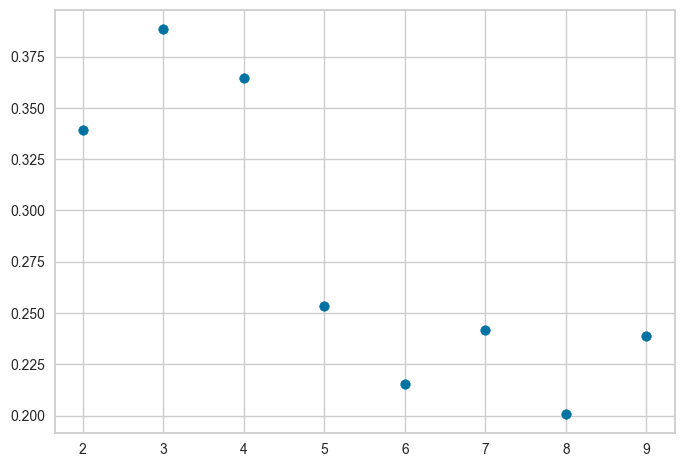

In [61]:
k_max = 10

silhouette = []
for k in range(2, k_max):
    gmm = GaussianMixture(n_components=k, init_params='kmeans', n_init=30)
    clusters_gmm = gmm.fit_predict(velib_PCA_reduced)
    silhouette.append( silhouette_score(velib_PCA_reduced, clusters_gmm, metric='euclidean') )
silhouette = np.array(silhouette)

plt.scatter(range(2, k_max), silhouette)
plt.show()


Interprétation : Le critère BIC nous dit qu'il faut 8 clusters.

In [62]:
def draw_ellipse(mean, covariance, alpha, ax, col='#CCCCCC'):
    """Draw an ellipse with a given position and covariance"""    
    # Convert covariance to principal axes
    U, s, Vt = np.linalg.svd(covariance)
    angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
    width, height = 2 * np.sqrt(s)

    # Draw the Ellipse
    ax.add_patch(Ellipse(mean, 4*width, 4*height, angle=angle, alpha=alpha, fc=col))

In [63]:
def plotGMM(gmm, data, n_clusters=6):
    gmm.fit(data)
    clusters_gmm = gmm.predict(data)
    
    ax = plt.gca()
    ax.axis('equal')
    cmap = plt.get_cmap('Set3', n_clusters)
    
    # plot the input data
    ax.scatter(data[:, 0], data[:, 1], c=clusters_gmm, s=1, linewidths=1, cmap=cmap)
    
    # w_factor = 0.2 / gmm.weights_.max()
    for i in range(n_clusters):
        mean = gmm.means_[i,:2]
        covariance = gmm.covariances_[i,:2,:2]
        w = gmm.weights_[i]
        draw_ellipse(mean, covariance, w, ax, cmap.colors[i])


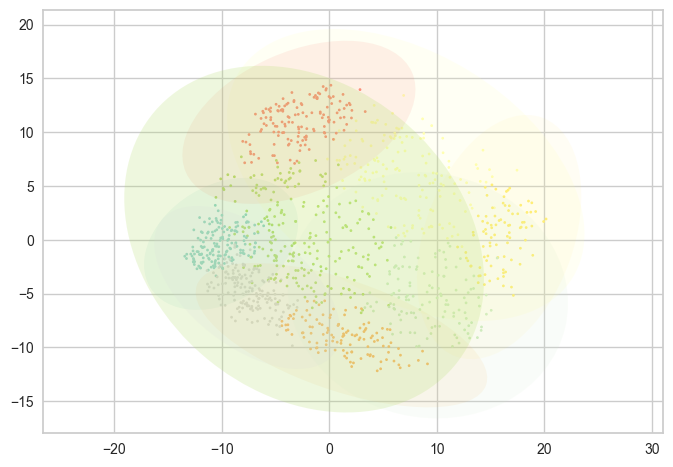

In [64]:
K = 8
gmm = GaussianMixture(n_components=K, init_params='kmeans')

plotGMM(gmm,velib_PCA_reduced ,K)

## Comparaison des clusters entre GMM et Kmeans en utilisant la matrice de confusion

In [65]:
from scipy.spatial.distance import cdist
from matplotlib.patches import Ellipse

In [66]:
def plotKmeans(kmeans, data, n_clusters=4):
    kmeans.fit(data)
    clusters_kmeans = kmeans.predict(data)

    ax = plt.gca()
    ax.axis('equal')
    cmap = plt.get_cmap('Set3', n_clusters)

    # plot the input data
    ax.scatter(data[:, 0], data[:, 1], c=clusters_kmeans, s=1, linewidths=1, cmap=cmap)
    
    # plot the representation of the KMeans model
    centers = kmeans.cluster_centers_
    radius = [cdist(data[clusters_kmeans == i], [center]).max() for i, center in enumerate(centers)]
    for i in range(n_clusters):
        ax.add_patch(plt.Circle(centers[i], radius[i], fc=cmap.colors[i], alpha=0.3))

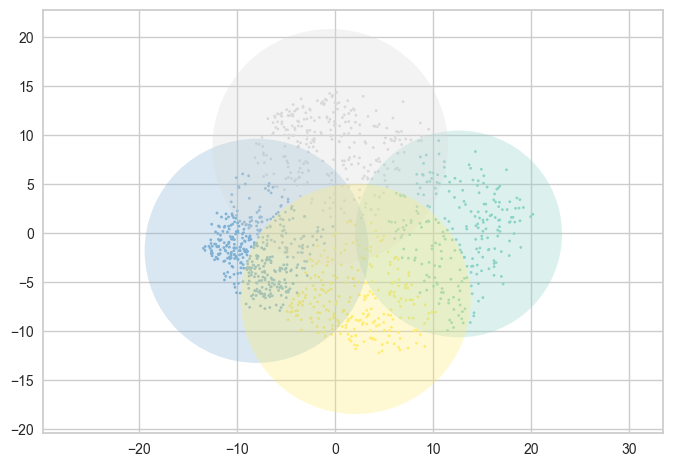

In [67]:
K = 4
kmeans = KMeans(n_clusters=K)

plotKmeans(kmeans, velib_PCA_reduced,K)

In [68]:
kmeans = KMeans(n_clusters=4, n_init=10)
clusters_kmeans = kmeans.fit_predict(velib_PCA_reduced)

gmm = GaussianMixture(n_components=8, n_init=10, init_params='kmeans')
clusters_gmm = gmm.fit_predict(velib_PCA_reduced)

In [69]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def matchClasses(classif1, classif2):
    cm = confusion_matrix(classif1, classif2)
    K = cm.shape[0]
    a, b = np.zeros(K), np.zeros(K)
    for j in range(K):
        for i in range(K):
            if (a[j] < cm[i,j]):
                a[j] = cm[i,j]
                b[j] = i 
    a = a.astype(int)
    b = b.astype(int)
                                             
    print ("")
    print ("Classes size:", a)
    print ("Class (in the classif1 numbering):", b)
    print ("")
    
    table = cm.copy()
    for i in range(K):
        table[:,b[i]] = cm[:,i]   
        
    clusters = classif2.copy()
    n = classif2.shape[0]
    for i in range(n):
        for j in range(K):
            if (classif2[i] == j):
                clusters[i] = b[j]
        
    return table, clusters


Classes size: [130 113 149 136   0   0   0   0]
Class (in the classif1 numbering): [2 7 4 6 0 0 0 0]



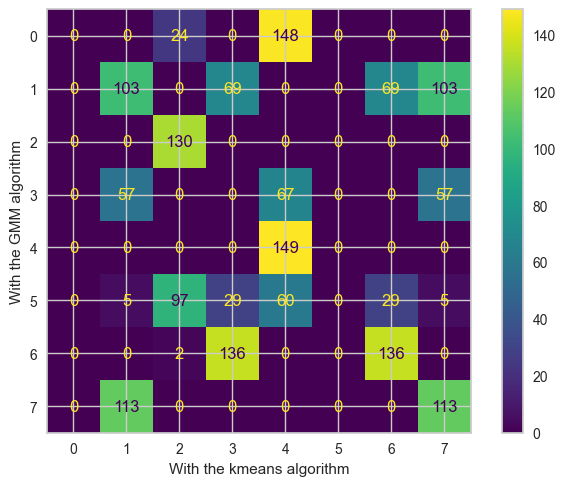

In [70]:
cm, clusters_kmeans_sorted = matchClasses(clusters_gmm, clusters_kmeans)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm')
plt.ylabel('With the GMM algorithm')

plt.show()

### Comparaison des clusters à l'aide de la map de Paris

In [71]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_gmm.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_gmm, lat=Position[:,1], lon=Position[:,0], color=clusters_gmm,
                    color_discrete_sequence=['aliceblue', 'darkgrey', 'forestgreen', 'fuchsia'],
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters GMM on pca")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()

In [72]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_kmeans_sorted.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_kmeans_sorted, lat=Position[:,1], lon=Position[:,0], color=clusters_kmeans_sorted,
                    color_discrete_sequence=['aliceblue', 'darkgrey', 'forestgreen', 'fuchsia'],
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters Kmeans on pca")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()

# CA

In [73]:
import numpy as np
import prince

import matplotlib.pyplot as plt
import seaborn as sns

## CA : Matrice Confusion CAH


Classes size: [257 124 393 119]
Class (in the classif1 numbering): [2 3 0 1]



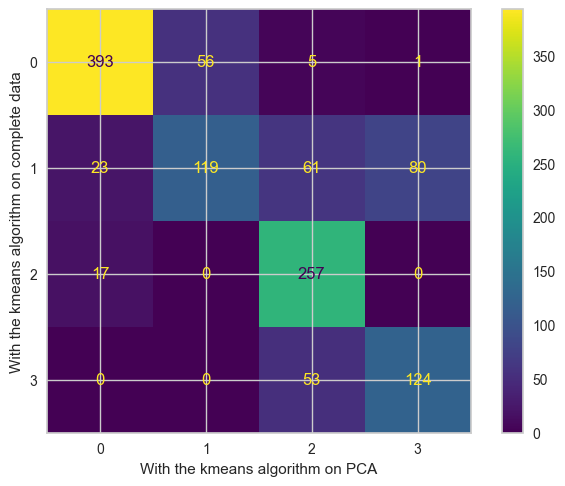

[[393  56   5   1]
 [ 23 119  61  80]
 [ 17   0 257   0]
 [  0   0  53 124]]

Pandas DataFrame: 


,gr0,gr1,gr2,gr3
0,393,56,5,1
1,23,119,61,80
2,17,0,257,0
3,0,0,53,124


In [74]:
cm, clusters_ac_raw_sorted = matchClasses(clusters_ac, clusters_ac_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm on PCA')
plt.ylabel('With the kmeans algorithm on complete data')

plt.show()

print(cm)


# convert numpy array to dataframe
df_cm = pd.DataFrame(cm, columns =['gr0', 'gr1', 'gr2', 'gr3'])
print("\nPandas DataFrame: ")
df_cm

In [75]:
ca = prince.CA(
    n_components=15,
    n_iter=10,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
ca = ca.fit(df_cm)

In [76]:
ca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.751,54.89%,54.89%
1,0.444,32.47%,87.36%
2,0.173,12.64%,100.00%


In [77]:
ca.row_coordinates(df_cm)

,0,1,2
0,1.061085,0.101109,-0.125704
1,-0.287880,-0.589482,0.632072
2,-0.869479,1.018119,0.004788
3,-0.921392,-0.893479,-0.694876


In [78]:
ca.column_coordinates(df_cm)

,0,1,2
gr0,1.054149,0.150662,-0.193118
gr1,0.165903,-0.552810,0.936590
gr2,-0.873158,0.713586,0.014898
gr3,-0.766695,-1.155138,-0.418949


In [79]:
ca.plot(
    df_cm,
    x_component=0,
    y_component=1,
    show_row_markers=True,
    show_column_markers=True,
    show_row_labels=False,
    show_column_labels=False
)

alt.LayerChart(...)

In [80]:
ca.row_contributions_.style.format('{:.0%}')

,0,1,2
0,57%,1%,3%
1,3%,19%,55%
2,23%,54%,0%
3,17%,27%,42%


In [81]:
ca.column_contributions_.style.format('{:.0%}')

,0,1,2
gr0,54%,2%,8%
gr1,1%,10%,75%
gr2,32%,36%,0%
gr3,13%,52%,17%


In [82]:
ca.row_cosine_similarities(df_cm)

,0,1,2
0,0.977408,0.008875,0.013717
1,0.099864,0.418723,0.481414
2,0.421734,0.578253,0.000013
3,0.398552,0.374770,0.226678


In [83]:
ca.column_cosine_similarities(df_cm)

,0,1,2
gr0,0.948777,0.019381,0.031843
gr1,0.022741,0.252493,0.724766
gr2,0.599454,0.400371,0.000175
gr3,0.280224,0.636104,0.083672


## CA : Matrice Confusion KNN et GMM


Classes size: [130 113 149 136   0   0   0   0]
Class (in the classif1 numbering): [2 7 4 6 0 0 0 0]



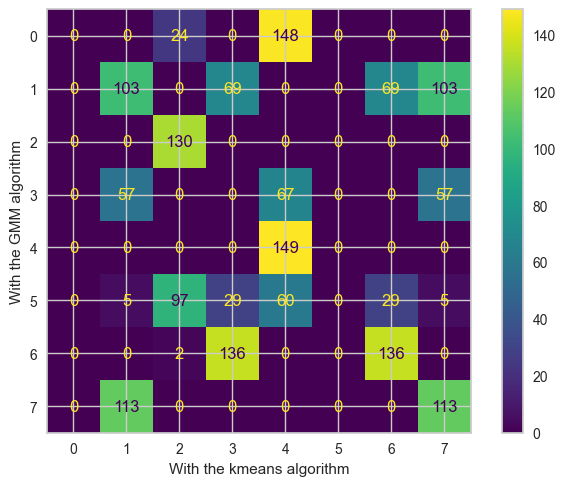

[[  0   0  24   0 148   0   0   0]
 [  0 103   0  69   0   0  69 103]
 [  0   0 130   0   0   0   0   0]
 [  0  57   0   0  67   0   0  57]
 [  0   0   0   0 149   0   0   0]
 [  0   5  97  29  60   0  29   5]
 [  0   0   2 136   0   0 136   0]
 [  0 113   0   0   0   0   0 113]]

Pandas DataFrame: 
0
0


In [84]:
cm_gmm_kmeans, clusters_kmeans_sorted = matchClasses(clusters_gmm, clusters_kmeans)

ConfusionMatrixDisplay(cm_gmm_kmeans).plot()
plt.xlabel('With the kmeans algorithm')
plt.ylabel('With the GMM algorithm')

plt.show()

print(cm_gmm_kmeans)


# convert numpy array to dataframe
df_cm_gmm_kmeans = pd.DataFrame(cm_gmm_kmeans, columns =['gr0', 'gr1', 'gr2', 'gr3', 'gr4', 'gr5', 'gr6', 'gr7'])
print("\nPandas DataFrame: ")
df_cm_gmm_kmeans

#df_cm_gmm_kmeans.replace(0, np.inf, inplace=True)

#df_cm_gmm_kmeans

# Check for missing or infinite values
missing_values = df_cm_gmm_kmeans.isnull().sum().sum()
print(missing_values)
infinite_values = np.isinf(df_cm_gmm_kmeans).sum().sum()
print(infinite_values)

ca_gmm_knn = prince.CA(
    n_components=15,
    n_iter=10,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
ca_gmm_knn = ca_gmm_knn.fit(df_cm_gmm_kmeans)

ca_gmm_knn.eigenvalues_summary

ca_gmm_knn.row_coordinates(df_cm_gmm_kmeans)

ca_gmm_knn.column_coordinates(df_cm_gmm_kmeans)

ca_gmm_knn.plot(
    df_cm_gmm_kmeans,
    x_component=0,
    y_component=1,
    show_row_markers=True,
    show_column_markers=True,
    show_row_labels=False,
    show_column_labels=False
)

ca_gmm_knn.row_contributions_.style.format('{:.0%}')

ca_gmm_knn.column_contributions_.style.format('{:.0%}')

ca_gmm_knn.row_cosine_similarities(df_cm_gmm_kmeans)

ca_gmm_knn.column_cosine_similarities(df_cm_gmm_kmeans)

# MCA

## MCA sur toutes les données

In [85]:
# Définis les seuils
seuils = {
    'Vide': 0.2,
    'Faible': 0.4,
    'Moyen': 0.6,
    'Fort': 0.8,
    'Pleine': 1.0
}

# Définis les seuils
seuilsV2 = {
    'Vide': 0.33,
    'Moyen': 0.66,
    'Pleine': 1.0
}

seuilsV3 = {
    'Totalement Vide': 0.1,
    'Très Vide': 0.2,
    'Assez Faible': 0.3,
    'Faible': 0.4,
    'Moyen': 0.5,
    'Pas mal': 0.6,
    'Bien': 0.7,
    'Très Bien': 0.8,
    'Quasiment Pleine': 0.9,
    'Pleine': 1.0
}

# Définis les seuils
seuilsV4 = {
    'Vide': 0.5,
    'Plein': 1,
}

#Convertis les données en valeurs de seuil
def convert_to_threshold(value):
    for seuil, threshold in seuils.items():
        if value <= threshold:
            return seuil
    return 'très élevé'  # Si la valeur dépasse le seuil maximal

#Applique la fonction de conversion à chaque cellule du DataFrame
loading_quali = loading.applymap(convert_to_threshold)

loading_quali['Hill'] = Coord['bonus'].map({0: 'FAUX', 1:'VRAI'})
loading_quali['Hill2'] = Coord['bonus']




#Affiche le DataFrame avec les données qualitatives
loading_quali.head()

C:\Users\romai\AppData\Local\Temp/ipykernel_49500/1738361181.py:44: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23,Hill,Hill2
1,Vide,Vide,Vide,Vide,Vide,Vide,Vide,Vide,Vide,Vide,...,Vide,Vide,Faible,Vide,Vide,Vide,Vide,Vide,FAUX,0
2,Moyen,Moyen,Moyen,Moyen,Moyen,Moyen,Moyen,Moyen,Faible,Vide,...,Faible,Vide,Vide,Vide,Vide,Vide,Faible,Faible,FAUX,0
3,Faible,Vide,Vide,Vide,Vide,Vide,Vide,Vide,Vide,Vide,...,Faible,Vide,Vide,Faible,Faible,Faible,Faible,Moyen,FAUX,0
4,Pleine,Pleine,Pleine,Pleine,Pleine,Pleine,Pleine,Pleine,Pleine,Pleine,...,Pleine,Pleine,Pleine,Pleine,Fort,Fort,Fort,Fort,FAUX,0
5,Pleine,Pleine,Fort,Fort,Fort,Fort,Fort,Fort,Fort,Pleine,...,Moyen,Pleine,Pleine,Pleine,Fort,Fort,Fort,Moyen,FAUX,0


In [86]:
mca = prince.MCA(
    n_components=10,
    n_iter=50,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
mca = mca.fit(loading_quali)

In [87]:
display(mca.eigenvalues_summary)

mca.scree_plot()

#vap sup à 1, mieux qu'avant en term de variances expliquées
#vap inf à 1, moins bien qu'avant

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.393,9.92%,9.92%
1,0.234,5.91%,15.83%
2,0.119,3.00%,18.84%
3,0.078,1.96%,20.79%
4,0.068,1.71%,22.50%
5,0.057,1.44%,23.94%
6,0.053,1.33%,25.27%
7,0.048,1.20%,26.48%
8,0.045,1.13%,27.61%


alt.Chart(...)

In [88]:
mca.plot(
    loading_quali,
    x_component=0,
    y_component=1,
    show_column_markers=True,
    show_row_markers=True,
    show_column_labels=False,
    show_row_labels=False
)

#on projette dans ce graphe le résultat de la MCA 
#Elle affiche de couleurs diff si la personne a survécu ou non 

alt.LayerChart(...)

In [89]:
#ESt-ce qu'on peut faire en sorte 

def plot_mca(ax1=0, ax2=1, mca=mca, data2=loading_quali):
    dataset = mca.transform(data2)
    dataset.reset_index(inplace=True)
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue=data2['Hill2'],alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue=data2['Lun-00'],alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()

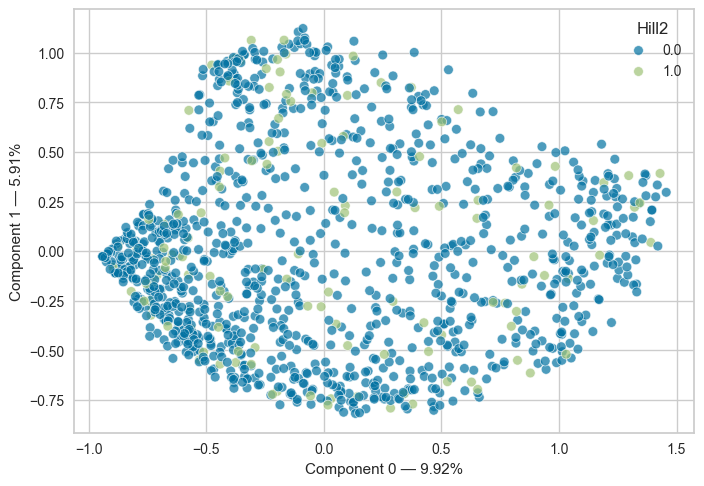

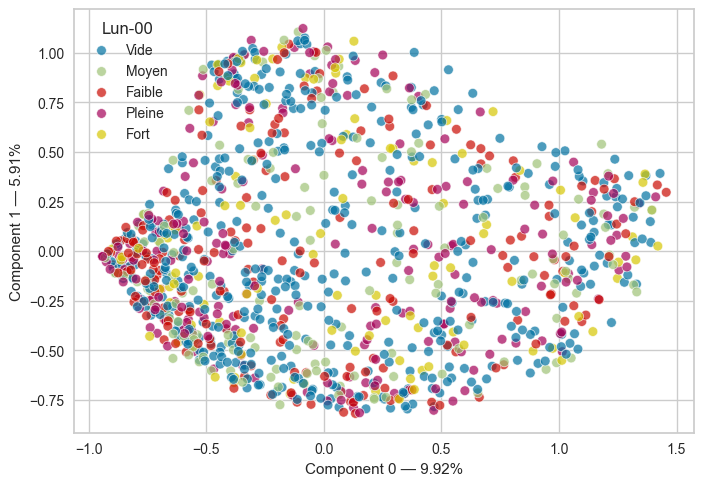

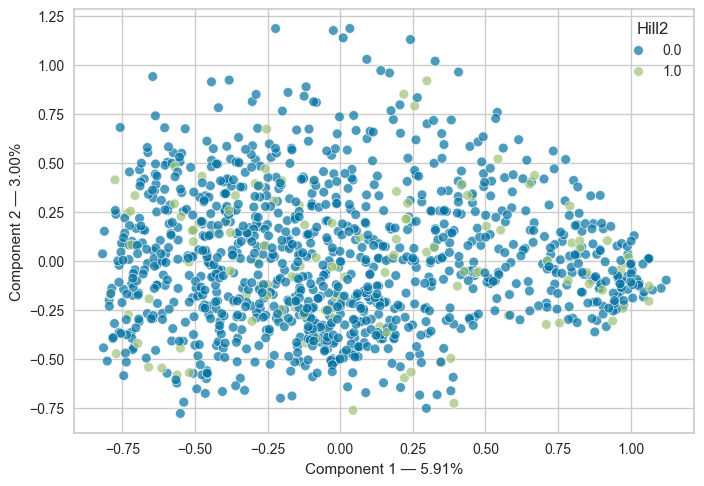

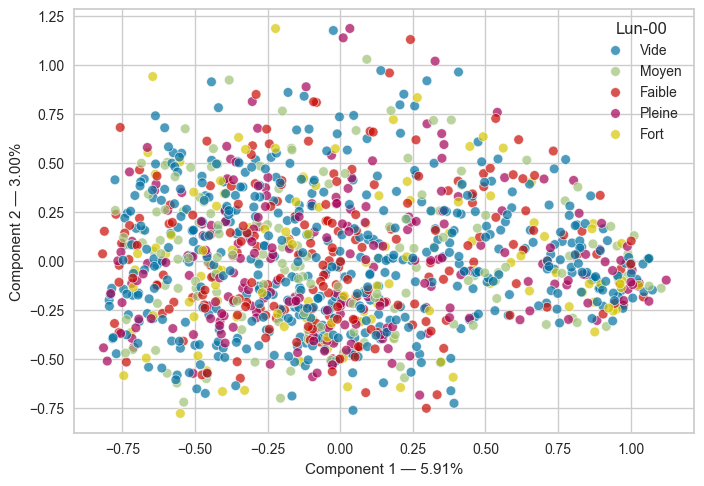

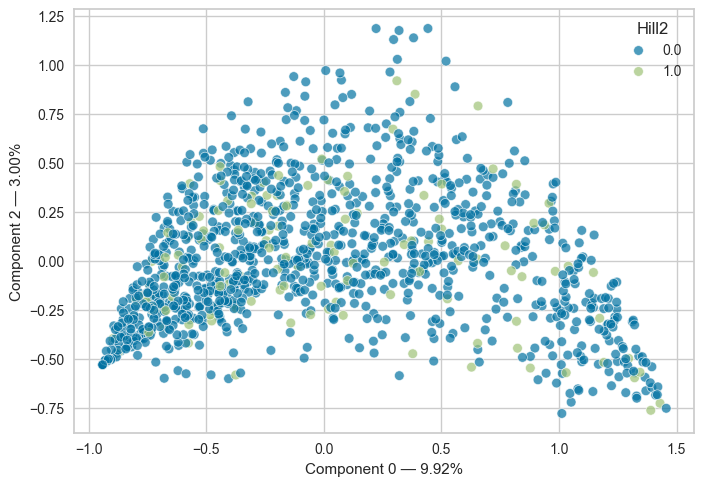

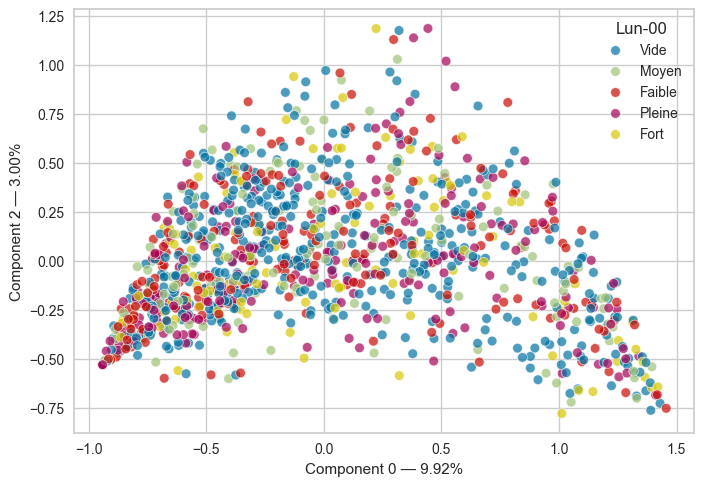

In [90]:
plot_mca(0,1)
plot_mca(1,2)
plot_mca(0,2)

In [91]:
contrib = mca.column_contributions_.style.format('{:.1%}')
display(contrib.highlight_max(color='orange').highlight_min(color='lightblue'))

,0,1,2,3,4,5,6,7,8,9
Lun-00_Faible,0.0%,0.0%,0.3%,0.0%,0.1%,0.0%,0.0%,0.2%,0.9%,0.0%
Lun-00_Fort,0.1%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.1%,0.1%,0.1%
Lun-00_Moyen,0.0%,0.0%,0.1%,0.0%,0.0%,0.1%,0.1%,0.0%,0.1%,0.2%
Lun-00_Pleine,0.4%,0.0%,0.1%,0.0%,0.0%,0.1%,0.3%,0.2%,0.9%,0.0%
Lun-00_Vide,0.3%,0.0%,0.1%,0.0%,0.1%,0.0%,0.0%,0.1%,0.0%,0.3%
Lun-01_Faible,0.0%,0.0%,0.3%,0.0%,0.2%,0.0%,0.0%,0.3%,1.0%,0.1%
Lun-01_Fort,0.1%,0.0%,0.0%,0.0%,0.0%,0.0%,0.0%,0.2%,0.1%,0.2%
Lun-01_Moyen,0.0%,0.0%,0.1%,0.0%,0.0%,0.2%,0.2%,0.1%,0.2%,0.1%
Lun-01_Pleine,0.4%,0.0%,0.1%,0.0%,0.0%,0.1%,0.5%,0.1%,1.0%,0.0%
Lun-01_Vide,0.3%,0.0%,0.1%,0.0%,0.1%,0.0%,0.0%,0.1%,0.0%,0.3%


In [92]:
#individus bien rep ? 
#ex : premier ind bien rep par la composante 10
quality_row = mca.row_cosine_similarities(loading_quali).head(10).style.format('{:.3}')
display(quality_row)

quality_column = mca.column_cosine_similarities(loading_quali).head(10).style.format('{:.3}')
display(quality_column.background_gradient())

,0,1,2,3,4,5,6,7,8,9
1,0.0279,0.0916,0.0208,0.0497,0.0353,0.00378,0.0033,0.0627,0.00031,0.00562
2,0.0592,0.166,0.0423,0.00129,0.118,0.00984,0.0049,0.00039,0.00977,0.000206
3,0.0143,0.00122,0.155,0.0151,3.61e-05,0.016,0.00138,0.00275,0.0101,0.0606
4,0.000212,0.162,0.000158,0.00201,0.0127,0.00275,0.0303,0.00251,0.0334,0.028
5,0.017,0.0476,0.0936,0.0196,0.00363,6.84e-06,0.00308,0.006,0.00351,0.00164
6,0.000418,0.0521,0.00816,0.00202,0.0205,0.00477,0.0615,0.00543,0.00116,1.55e-05
7,0.0065,0.0671,0.0848,0.00017,0.000561,0.00764,0.0643,0.0233,0.00218,0.0133
8,0.00242,0.109,0.088,0.0242,0.0203,0.0105,0.106,0.0643,0.0115,0.00842
9,0.0818,0.000904,0.0875,0.00175,0.0136,0.00465,0.0169,0.000758,0.188,0.0463
10,0.000534,0.000284,0.0157,0.00161,0.00333,0.0016,0.0475,0.124,0.0391,0.0374


,0,1,2,3,4,5,6,7,8,9
Lun-00_Faible,0.00385,0.0026,0.0729,1.63e-06,0.0169,0.000551,0.00246,0.0197,0.0876,0.00294
Lun-00_Fort,0.0569,0.00139,5.36e-05,0.000905,0.00118,0.000156,0.00151,0.00936,0.0112,0.00605
Lun-00_Moyen,0.00483,0.00224,0.0225,0.000732,0.00166,0.00796,0.0102,0.00355,0.00814,0.0133
Lun-00_Pleine,0.319,0.00221,0.0163,0.000331,0.000861,0.0086,0.0366,0.021,0.0848,0.000258
Lun-00_Vide,0.358,0.000136,0.0424,0.000179,0.016,0.000183,0.000423,0.0117,4.16e-05,0.0334
Lun-01_Faible,0.00694,0.00515,0.0701,5.33e-05,0.0226,0.00147,3.25e-05,0.0282,0.0943,0.00445
Lun-01_Fort,0.0591,0.00101,0.000218,0.000312,0.000155,0.00135,0.000674,0.0194,0.0124,0.017
Lun-01_Moyen,0.00346,0.00337,0.0266,0.00313,0.00119,0.0171,0.0167,0.00798,0.0145,0.00738
Lun-01_Pleine,0.293,0.000105,0.0219,0.00202,0.00031,0.00631,0.0518,0.0133,0.0906,0.000557
Lun-01_Vide,0.33,0.00683,0.0445,9.1e-05,0.0214,0.00682,0.00481,0.0142,3.32e-05,0.0331


## MCA sur les données jours nuit
Exemple : 

Lundi jour : Lun-07 à Lun-21

Lundi nuit : Lun-22 à Mar-06

In [93]:
labels = ['Hill','Nohill']

X_quali = pd.DataFrame({'hill' : Coord['bonus'].map(dict(zip([0, 1], labels)))})
jour = list(range(7,20)) # on se dit que la journée est de 7h à 21h
nuit = list(range(1,20)) # pareil pour la nuit mais de 21h à 7h
load = ['chargé', 'moyen', 'vide']

In [94]:
# on rassemble les heures de la journée par jour 

for i in range(1, 8):
    hour_offset = [x + (i-1)*24 for x in jour]
    newCol = loading.iloc[:, jour[0]+(i-1)*24: jour[-1]+ (i-1)*24+1].mean(axis=1)
    breaks = [-0.01, newCol.quantile(1/3), newCol.quantile(2/3),1.01]
    newCol = pd.cut(newCol, bins=breaks, labels=load)
    newName_jour = 'Jour' + str(i)
    X_quali[newName_jour] = newCol
    

In [95]:
#On rassemble les heures de la nuit par jour et on fait une moyenne pareil  

for i in range(1,8):
    newCol = loading.iloc[:, nuit[0]+(i-1)*24 : nuit[-1]+(i-1)*24+1].mean(axis=1)
    breaks = [-0.01, newCol.quantile(1/3), newCol.quantile(2/3), 1.01]
    newCol = pd.cut(newCol, bins=breaks, labels = load)
    newName_nuit = f"nuit{i}"
    X_quali[newName_nuit] = newCol.values

In [96]:
X_quali.head()

,hill,Jour1,Jour2,Jour3,Jour4,Jour5,Jour6,Jour7,nuit1,nuit2,nuit3,nuit4,nuit5,nuit6,nuit7
1,Hill,chargé,chargé,chargé,chargé,chargé,moyen,moyen,chargé,moyen,chargé,chargé,moyen,moyen,chargé
2,Hill,chargé,moyen,moyen,moyen,moyen,moyen,moyen,moyen,vide,moyen,moyen,moyen,vide,moyen
3,Hill,moyen,vide,moyen,moyen,vide,vide,moyen,moyen,vide,moyen,moyen,vide,vide,moyen
4,Hill,vide,vide,moyen,vide,vide,moyen,vide,vide,moyen,moyen,moyen,moyen,moyen,vide
5,Hill,vide,vide,vide,vide,vide,moyen,moyen,vide,vide,vide,moyen,vide,moyen,moyen


In [97]:
X_quali.shape

(1189, 15)

In [248]:
mca = prince.MCA(n_components = 5, n_iter = 10, copy=True, check_input = True, engine='sklearn', random_state=42) #Pourquoi 2 ????
mca.fit(X_quali)



MCA(n_components=5, random_state=42)

In [249]:
display(mca.eigenvalues_summary)

mca.scree_plot()

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.578,29.92%,29.92%
1,0.217,11.24%,41.16%
2,0.156,8.07%,49.23%
3,0.130,6.71%,55.95%
4,0.092,4.74%,60.69%


alt.Chart(...)

In [250]:
type(X_quali)

pandas.core.frame.DataFrame

In [251]:
mca.plot(
    X_quali,
    x_component=0,
    y_component=1,
    show_column_markers=True,
    show_row_markers=True,
    show_column_labels=False,
    show_row_labels=False
)

alt.LayerChart(...)

In [277]:
def plot_mcaV2(ax1=0, ax2=1, mca=mca, data2=X_quali):
    dataset = mca.transform(data2)
    dataset.reset_index(inplace=True)
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue=data2['hill'],alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()
    sns.scatterplot(data = dataset, x = ax1, y = ax2, hue=data2['Jour1'],alpha = 0.7)
    plt.xlabel('Component {} — {:.2f}%'.format(ax1, mca.percentage_of_variance_[ax1]))
    plt.ylabel('Component {} — {:.2f}%'.format(ax2, mca.percentage_of_variance_[ax2]))
    plt.grid(True)
    plt.show()

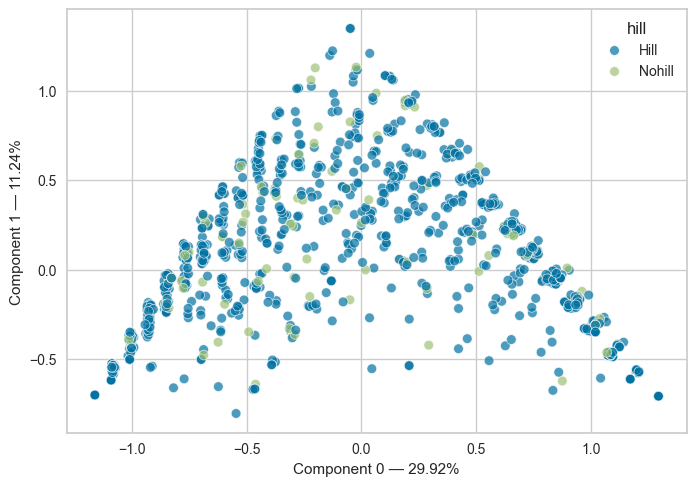

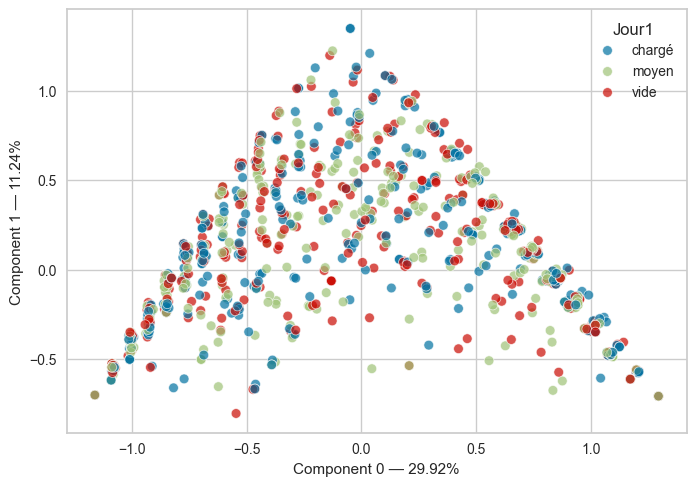

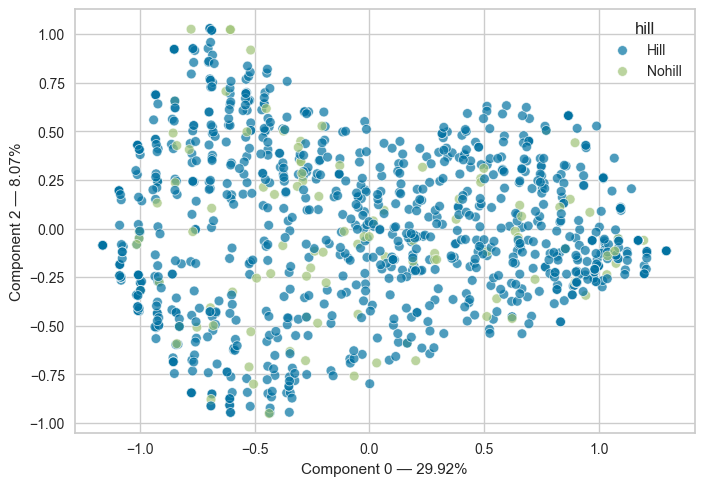

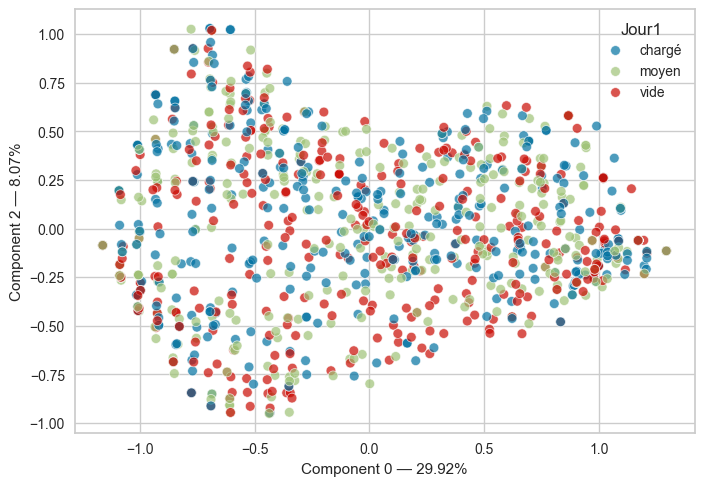

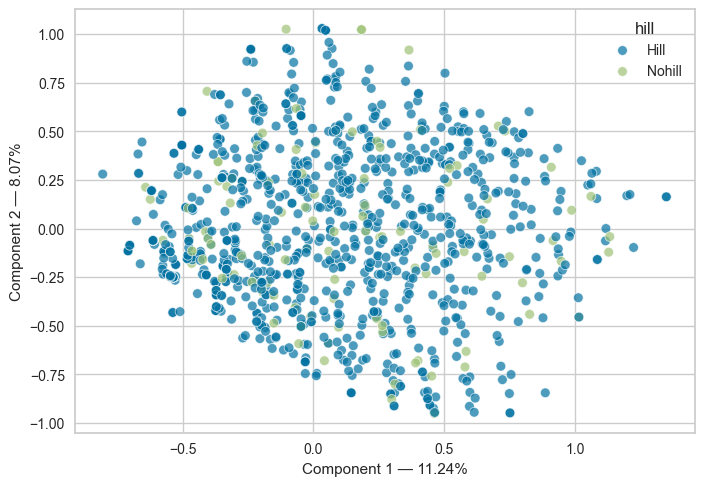

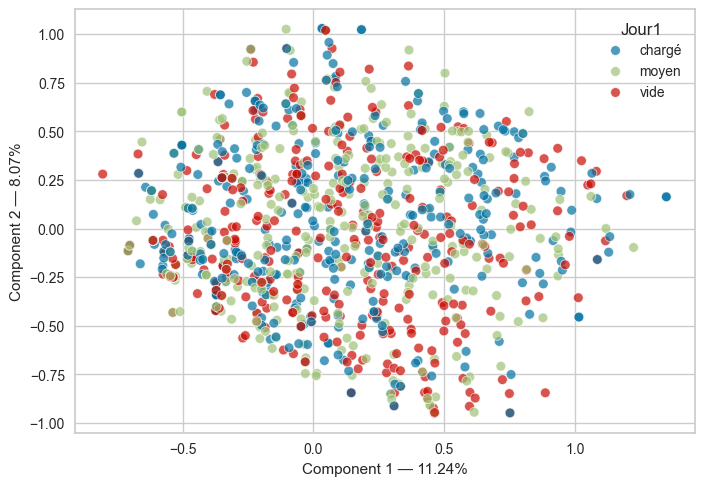

In [278]:
plot_mcaV2(0,1)
plot_mcaV2(0,2)
plot_mcaV2(1,2)

In [254]:
velib_mca_reduced = mca.row_coordinates(X_quali)
velib_mca_reduced

,0,1,2,3,4
1,0.761765,0.072580,0.466880,-0.348471,0.313520
2,-0.121548,0.983281,-0.017693,-0.049899,0.255990
3,-0.517834,0.514310,-0.170434,-0.056678,-0.058704
4,-0.601009,0.250518,0.337088,0.294824,0.638881
5,-0.768673,-0.102358,0.925370,-0.017975,-0.034666
...,...,...,...,...,...
1185,0.934457,-0.198041,0.271956,-0.292515,0.235969
1186,-0.368267,0.725108,0.508672,0.046063,-0.597318
1187,0.480557,0.158591,-0.091411,-0.187164,0.455272
1188,-0.491182,-0.348633,-0.254809,-0.199281,0.291372


In [255]:
contrib = mca.column_contributions_.style
display(contrib.highlight_max(color='orange').highlight_min(color='lightblue'))

,0,1,2,3,4
hill_Hill,0.002310,0.001390,0.000441,0.002361,0.000000
hill_Nohill,0.019313,0.011624,0.003684,0.019742,0.000001
Jour1_chargé,0.035995,0.005001,0.000309,0.012341,0.092902
Jour1_moyen,0.000033,0.049046,0.037059,0.000000,0.175051
Jour1_vide,0.033763,0.022667,0.030520,0.012345,0.012871
Jour2_chargé,0.041375,0.008171,0.001724,0.016904,0.016212
Jour2_moyen,0.000148,0.057222,0.049163,0.000023,0.025623
Jour2_vide,0.036692,0.021844,0.032154,0.015722,0.001023
Jour3_chargé,0.039597,0.008830,0.000076,0.014808,0.000534
Jour3_moyen,0.000125,0.059316,0.033348,0.000000,0.003844


In [256]:
# Supposons que `styler` est ton objet Styler
# Pour accéder au DataFrame original
df = contrib.data

# Ensuite, pour obtenir les labels des lignes
labels_lignes = df.index.tolist()

print(labels_lignes)

['hill_Hill', 'hill_Nohill', 'Jour1_chargé', 'Jour1_moyen', 'Jour1_vide', 'Jour2_chargé', 'Jour2_moyen', 'Jour2_vide', 'Jour3_chargé', 'Jour3_moyen', 'Jour3_vide', 'Jour4_chargé', 'Jour4_moyen', 'Jour4_vide', 'Jour5_chargé', 'Jour5_moyen', 'Jour5_vide', 'Jour6_chargé', 'Jour6_moyen', 'Jour6_vide', 'Jour7_chargé', 'Jour7_moyen', 'Jour7_vide', 'nuit1_chargé', 'nuit1_moyen', 'nuit1_vide', 'nuit2_chargé', 'nuit2_moyen', 'nuit2_vide', 'nuit3_chargé', 'nuit3_moyen', 'nuit3_vide', 'nuit4_chargé', 'nuit4_moyen', 'nuit4_vide', 'nuit5_chargé', 'nuit5_moyen', 'nuit5_vide', 'nuit6_chargé', 'nuit6_moyen', 'nuit6_vide', 'nuit7_chargé', 'nuit7_moyen', 'nuit7_vide']


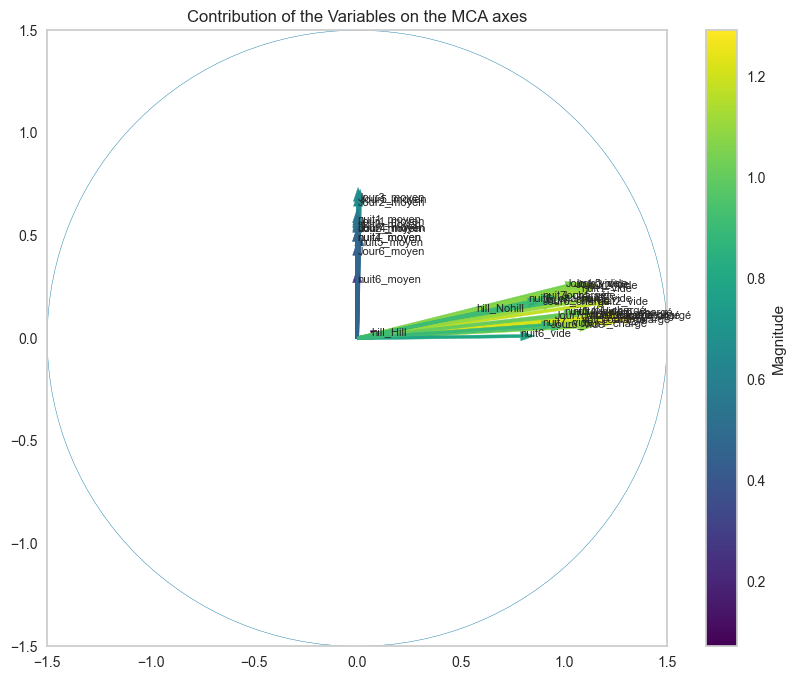

In [311]:
coord1 = mca.column_contributions_[0] * mca.percentage_of_variance_[0]
coord2 = mca.column_contributions_[1] * mca.percentage_of_variance_[1]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1)

# Calcul de la magnitude des vecteurs
magnitude = np.sqrt(coord1**2 + coord2**2)

# Utilisation d'une colormap pour mapper les valeurs de magnitude à une couleur
norm = plt.Normalize(vmin=magnitude.min(), vmax=magnitude.max())
cmap = plt.cm.viridis  # Tu peux choisir une autre colormap si tu préfères

for i, j, nom, mag in zip(coord1, coord2, labels_lignes, magnitude):
    color = cmap(norm(mag))
    plt.text(i, j, nom, fontsize=8)
    plt.arrow(0, 0, i, j, color=color, width=0.015)
plt.axis((-1.5, 1.5, -1.5, 1.5))

# Cercle
c = plt.Circle((0, 0), radius=1.5, color='b', fill=False)
ax.add_patch(c)

plt.title('Contribution of the Variables on the MCA axes')
plt.grid(False)

# Ajouter une barre de couleur
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Magnitude')

plt.show()

In [258]:
quality_row = mca.row_cosine_similarities(X_quali).head(10).style.format('{:.3}')
display(quality_row.background_gradient())

quality_column = mca.column_cosine_similarities(X_quali).style.format('{:.3}')
display(quality_column.background_gradient())

,0,1,2,3,4
1,0.309,0.00281,0.116,0.0648,0.0524
2,0.00787,0.515,0.000167,0.00133,0.0349
3,0.143,0.141,0.0155,0.00171,0.00184
4,0.193,0.0335,0.0606,0.0464,0.218
5,0.315,0.00559,0.457,0.000172,0.000641
6,0.0563,0.0469,0.155,0.0201,0.155
7,0.000149,0.411,0.0431,0.0053,0.0155
8,0.00442,0.111,0.0619,0.0101,0.301
9,0.319,0.00704,0.244,0.0227,0.0487
10,0.0228,0.00889,0.0845,0.00992,0.0121


,0,1,2,3,4
hill_Hill,0.188,0.0424,0.00966,0.043,1.35e-06
hill_Nohill,0.188,0.0424,0.00966,0.043,1.35e-06
Jour1_chargé,0.468,0.0244,0.00109,0.036,0.192
Jour1_moyen,0.00043,0.24,0.13,7.55e-08,0.361
Jour1_vide,0.44,0.111,0.107,0.0361,0.0266
Jour2_chargé,0.54,0.04,0.00607,0.0495,0.0335
Jour2_moyen,0.00192,0.279,0.172,6.75e-05,0.0527
Jour2_vide,0.478,0.107,0.113,0.046,0.00211
Jour3_chargé,0.516,0.0432,0.000269,0.0433,0.0011
Jour3_moyen,0.00163,0.29,0.117,6.98e-08,0.00792


In [259]:
# Supposons que `styler` est ton objet Styler
# Pour accéder au DataFrame original
df = quality_column.data

# Ensuite, pour obtenir les labels des lignes
labels_lignes = df.index.tolist()

print(labels_lignes)

['hill_Hill', 'hill_Nohill', 'Jour1_chargé', 'Jour1_moyen', 'Jour1_vide', 'Jour2_chargé', 'Jour2_moyen', 'Jour2_vide', 'Jour3_chargé', 'Jour3_moyen', 'Jour3_vide', 'Jour4_chargé', 'Jour4_moyen', 'Jour4_vide', 'Jour5_chargé', 'Jour5_moyen', 'Jour5_vide', 'Jour6_chargé', 'Jour6_moyen', 'Jour6_vide', 'Jour7_chargé', 'Jour7_moyen', 'Jour7_vide', 'nuit1_chargé', 'nuit1_moyen', 'nuit1_vide', 'nuit2_chargé', 'nuit2_moyen', 'nuit2_vide', 'nuit3_chargé', 'nuit3_moyen', 'nuit3_vide', 'nuit4_chargé', 'nuit4_moyen', 'nuit4_vide', 'nuit5_chargé', 'nuit5_moyen', 'nuit5_vide', 'nuit6_chargé', 'nuit6_moyen', 'nuit6_vide', 'nuit7_chargé', 'nuit7_moyen', 'nuit7_vide']


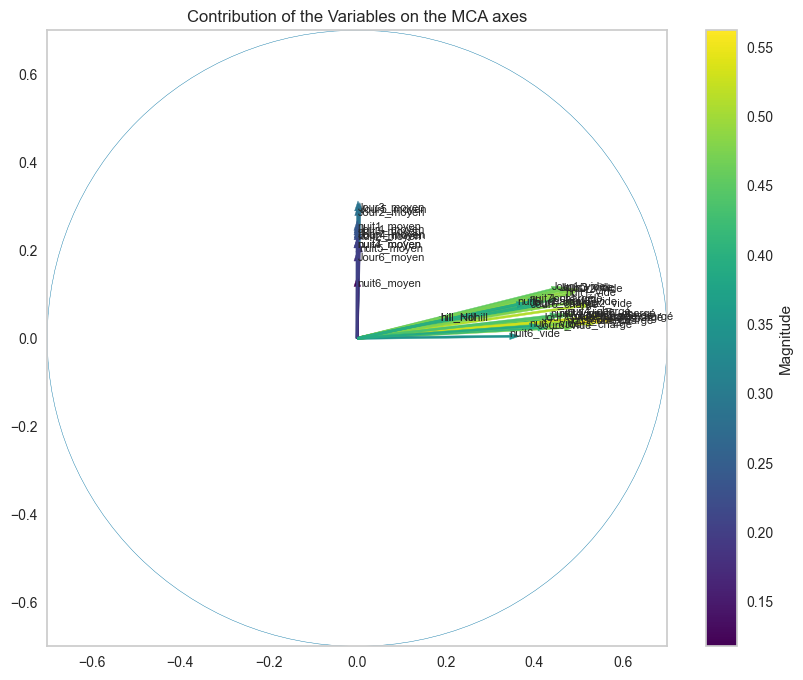

In [275]:
coord1 = mca.column_cosine_similarities(X_quali)[0]
coord2 = mca.column_cosine_similarities(X_quali)[1]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1)

# Calcul de la magnitude des vecteurs
magnitude = np.sqrt(coord1**2 + coord2**2)

# Utilisation d'une colormap pour mapper les valeurs de magnitude à une couleur
norm = plt.Normalize(vmin=magnitude.min(), vmax=magnitude.max())
cmap = plt.cm.viridis  # Tu peux choisir une autre colormap si tu préfères

for i, j, nom, mag in zip(coord1, coord2, labels_lignes, magnitude):
    color = cmap(norm(mag))
    plt.text(i, j, nom, fontsize=8)
    plt.arrow(0, 0, i, j, color=color, width=0.005)
plt.axis((-0.7, 0.7, -0.7, 0.7))

# Cercle
c = plt.Circle((0, 0), radius=0.7, color='b', fill=False)
ax.add_patch(c)

plt.title('Contribution of the Variables on the MCA axes')
plt.grid(False)

# Ajouter une barre de couleur
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Magnitude')

plt.show()

## Clustering Kmeans sur la MCA

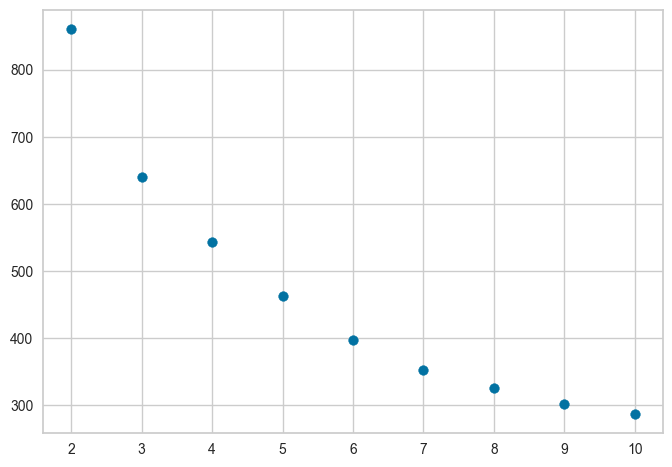

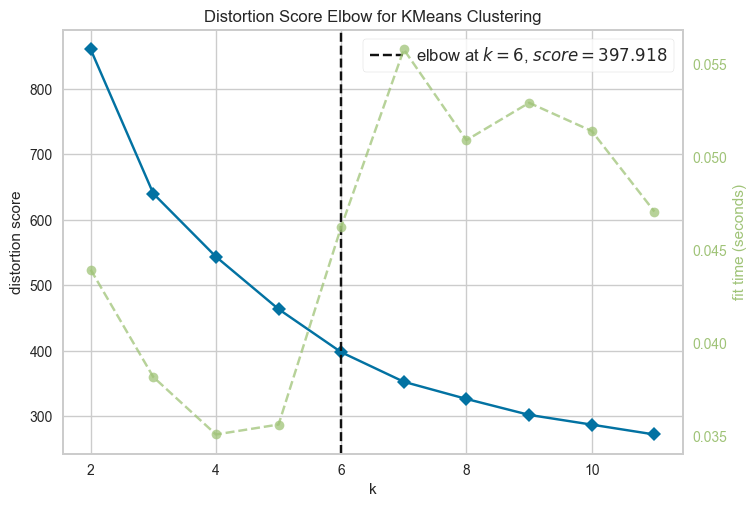

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [261]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
    kmeans.fit(velib_mca_reduced)
    inertia.append(kmeans.inertia_)
inertia = np.array(inertia)

plt.scatter(range(2, 11), inertia[1:])
plt.show()


# --- #


# Using yellowbrick

kmeans = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(2,12))

visualizer.fit(velib_mca_reduced)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

In [269]:
K = 5
kmeans_mca = KMeans(n_clusters=K, random_state=0)
clusters_kmeans_mca = kmeans_mca.fit_predict(velib_mca_reduced)

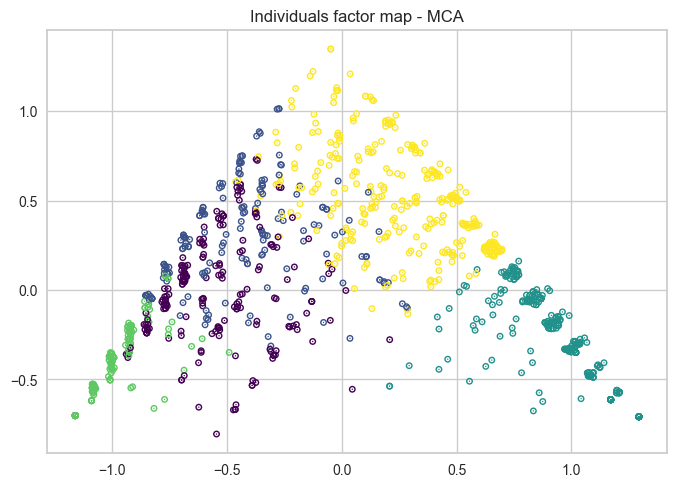

In [270]:
plt.scatter(velib_mca_reduced[0], velib_mca_reduced[1], c=clusters_kmeans_mca, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - MCA")
plt.show()

In [271]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_kmeans_mca.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_kmeans_mca, lat=Position[:,1], lon=Position[:,0], color=clusters_kmeans_mca,
                    color_discrete_sequence=px.colors.qualitative.Set1,
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters MCA on MCA reduced data")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()

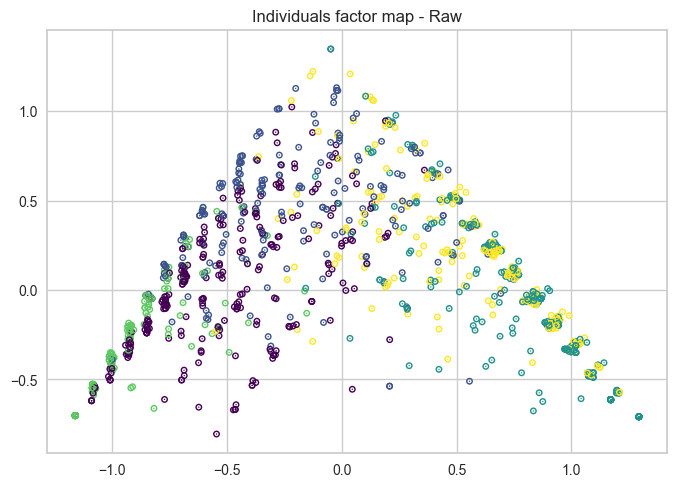

In [272]:
#On fait un clustering Kmeans sur le jeu de données loading complet
K = 5
kmeans_raw = KMeans(n_clusters=K, random_state=0)
clusters_raw = kmeans_raw.fit_predict(loading)

plt.scatter(velib_mca_reduced[0], velib_mca_reduced[1], c=clusters_raw, s=1, linewidths=4, cmap=cmap)
plt.title("Individuals factor map - Raw")
plt.show()

In [273]:
df_clusters =  pd.DataFrame({
    'latitude': Position[:,1],
    'longitude': Position[:,0],
    'cluster': clusters_raw.astype(int)

})

fig_cluster = px.scatter_mapbox(clusters_raw, lat=Position[:,1], lon=Position[:,0], color=clusters_raw,
                    color_discrete_sequence=px.colors.qualitative.Set1,
                  size_max=15, zoom=10,
                  mapbox_style="carto-positron", title ="Individual factor map with clusters MCA on raw data")
fig_cluster.update_layout(showlegend=True)
fig_cluster.show()


Classes size: [173 108 223 153 112]
Class (in the classif1 numbering): [0 1 2 3 4]



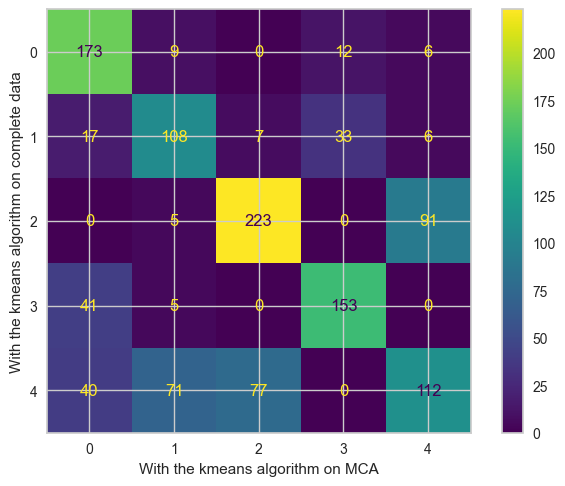

In [274]:
cm, clusters_kmean_raw_sorted = matchClasses(clusters_kmeans_mca, clusters_raw)

ConfusionMatrixDisplay(cm).plot()
plt.xlabel('With the kmeans algorithm on MCA')
plt.ylabel('With the kmeans algorithm on complete data')

plt.show()